# Airbnb NYC Price Prediction Analysis

## Overview

This project analyzes the 2019 Airbnb New York City dataset to understand how different listing characteristics influence pricing patterns in the NYC Airbnb market.

## Research Question

How do different listing characteristics (room type, number of reviews, and availability) influence Airbnb prices in New York City?

## Response Variable

- **Price**: The nightly price of the Airbnb listing in USD


## 1. Data Loading and Initial Exploration


In [1]:
airbnb <- read.csv("./data/AB_NYC_2019.csv")
airbnb |> head()


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<chr>,<dbl>,<int>,<int>
1,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
2,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,,NA,1,365
4,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
5,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
6,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129


In [2]:
# drop hard to use variables
# name, id, host_id, host_name, last_review
airbnb <- airbnb[, !names(airbnb) %in% c("name", "id", "host_id", "host_name", "last_review")]
airbnb |> head()


,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>
1,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
2,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
3,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NA,1,365
4,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
5,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
6,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,0.59,1,129


In [3]:
Y <- airbnb$price
X <- airbnb[, c("room_type", "number_of_reviews", "availability_365")]
X |> head()
Y |> head()


,room_type,number_of_reviews,availability_365
,<chr>,<int>,<int>
1,Private room,9,365
2,Entire home/apt,45,355
3,Private room,0,365
4,Entire home/apt,270,194
5,Entire home/apt,9,0
6,Entire home/apt,74,129


[1] 149 225 150  89  80 200

Research question: How do different listing characteristics (room type, number of reviews, and availability) influence Airbnb
prices in New York City?


Response: price


## 2. Exploratory Data Analysis (EDA)

### 2.1 Price Distribution Analysis


In [4]:
# Summary statistics of price variable
summary(Y)


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0    69.0   106.0   152.7   175.0 10000.0 

### 2.2 Variable Distributions


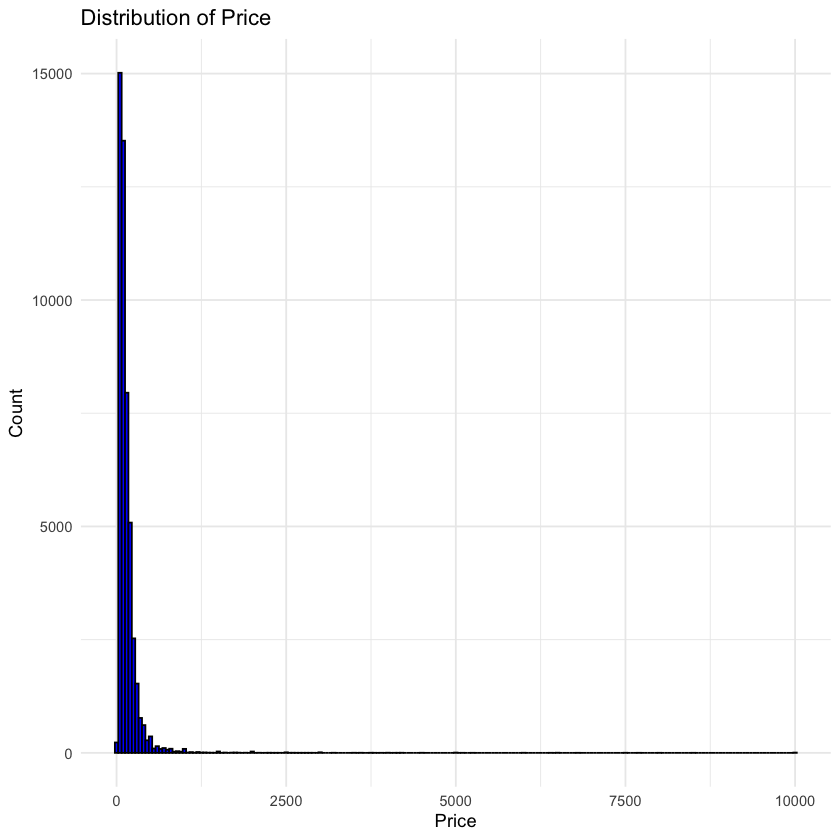

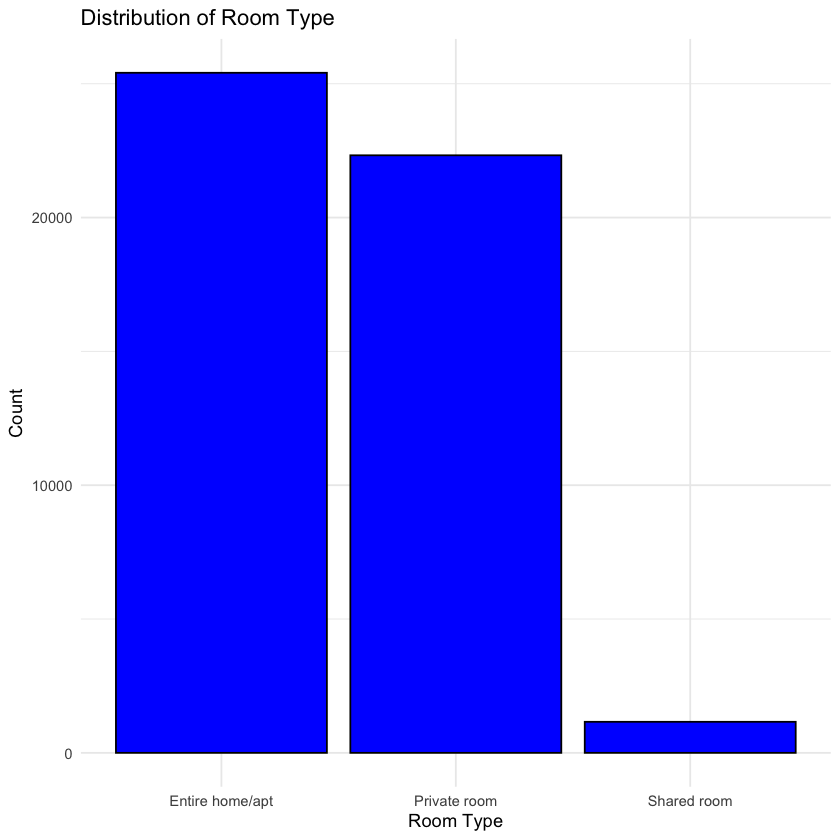

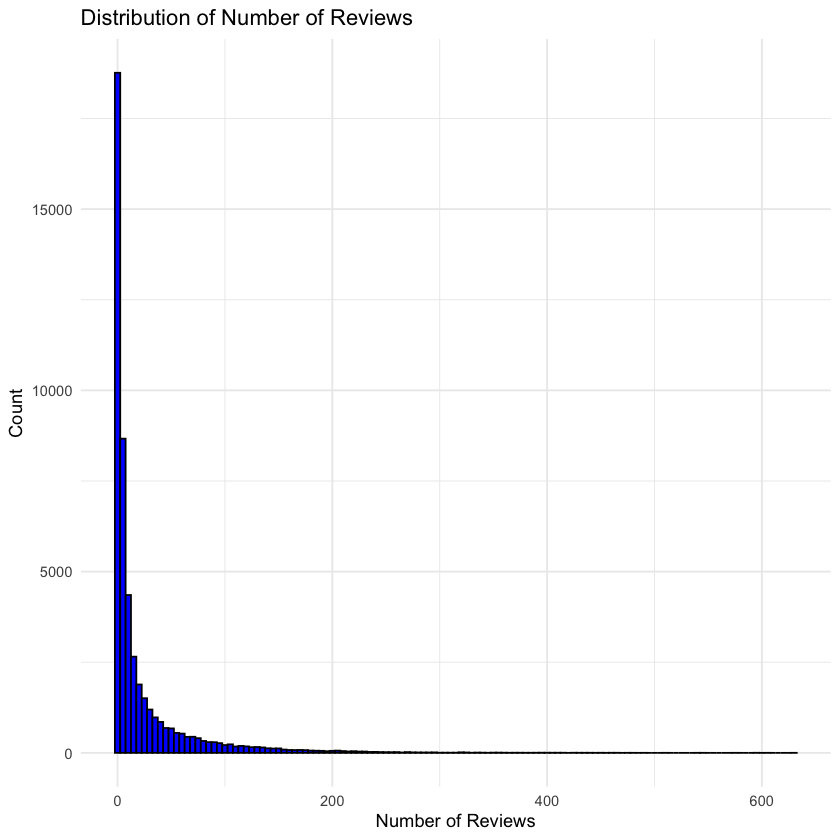

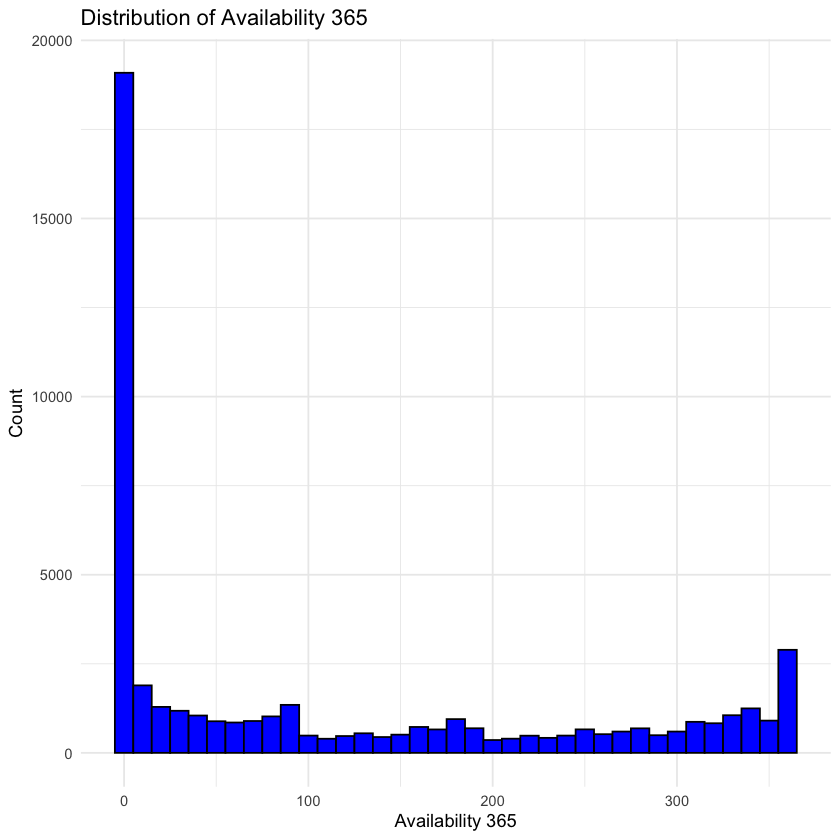

In [5]:
# distribution of each variable
library(ggplot2)
ggplot(airbnb, aes(x = price)) +
  geom_histogram(binwidth = 50, fill = "blue", color = "black") +
  labs(title = "Distribution of Price", x = "Price", y = "Count") +
  theme_minimal()
ggplot(airbnb, aes(x = room_type)) +
  geom_bar(fill = "blue", color = "black") +
  labs(title = "Distribution of Room Type", x = "Room Type", y = "Count") +
  theme_minimal()
ggplot(airbnb, aes(x = number_of_reviews)) +
  geom_histogram(binwidth = 5, fill = "blue", color = "black") +
  labs(title = "Distribution of Number of Reviews", x = "Number of Reviews", y = "Count") +
  theme_minimal()
ggplot(airbnb, aes(x = availability_365)) +
  geom_histogram(binwidth = 10, fill = "blue", color = "black") +
  labs(title = "Distribution of Availability 365", x = "Availability 365", y = "Count") +
  theme_minimal()


In [6]:
# convert categorical variable to factor
X$room_type <- as.factor(X$room_type)


### 2.3 Correlation Analysis


In [7]:
# correlation matrix
corr_matrix <- cor(airbnb[, sapply(airbnb, is.numeric)])
corr_matrix


,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.00000000,0.08478837,0.03393867,0.02486927,-0.01538880,NA,0.01951735,-0.01098346
longitude,0.08478837,1.00000000,-0.15001927,-0.06274711,0.05909429,NA,-0.11471279,0.08273075
price,0.03393867,-0.15001927,1.00000000,0.04279933,-0.04795423,NA,0.05747169,0.08182883
minimum_nights,0.02486927,-0.06274711,0.04279933,1.00000000,-0.08011607,NA,0.12795963,0.14430306
number_of_reviews,-0.01538880,0.05909429,-0.04795423,-0.08011607,1.00000000,NA,-0.07237606,0.17202758
reviews_per_month,NA,NA,NA,NA,NA,1,NA,NA
calculated_host_listings_count,0.01951735,-0.11471279,0.05747169,0.12795963,-0.07237606,NA,1.00000000,0.22570137
availability_365,-0.01098346,0.08273075,0.08182883,0.14430306,0.17202758,NA,0.22570137,1.00000000


In [8]:
# correlation with the response
correlation_with_response <- cor(airbnb$price, airbnb[, sapply(airbnb, is.numeric)])
correlation_with_response


latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0.03393867,-0.1500193,1,0.04279933,-0.04795423,NA,0.05747169,0.08182883


corrplot 0.95 loaded



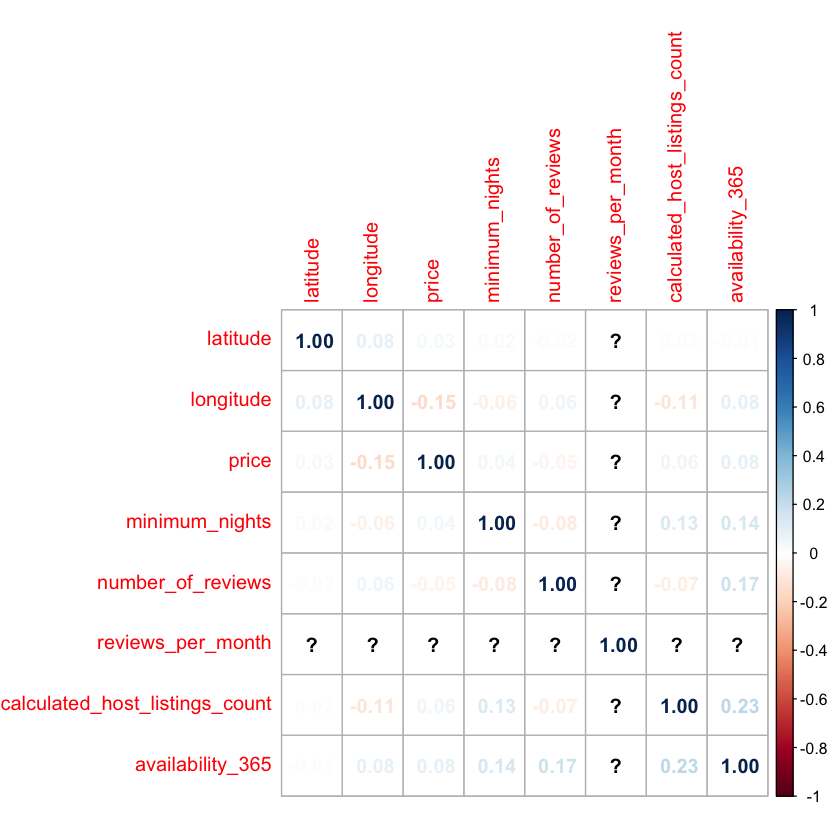

In [9]:
library(corrplot)
corrplot(corr_matrix, method = "number")


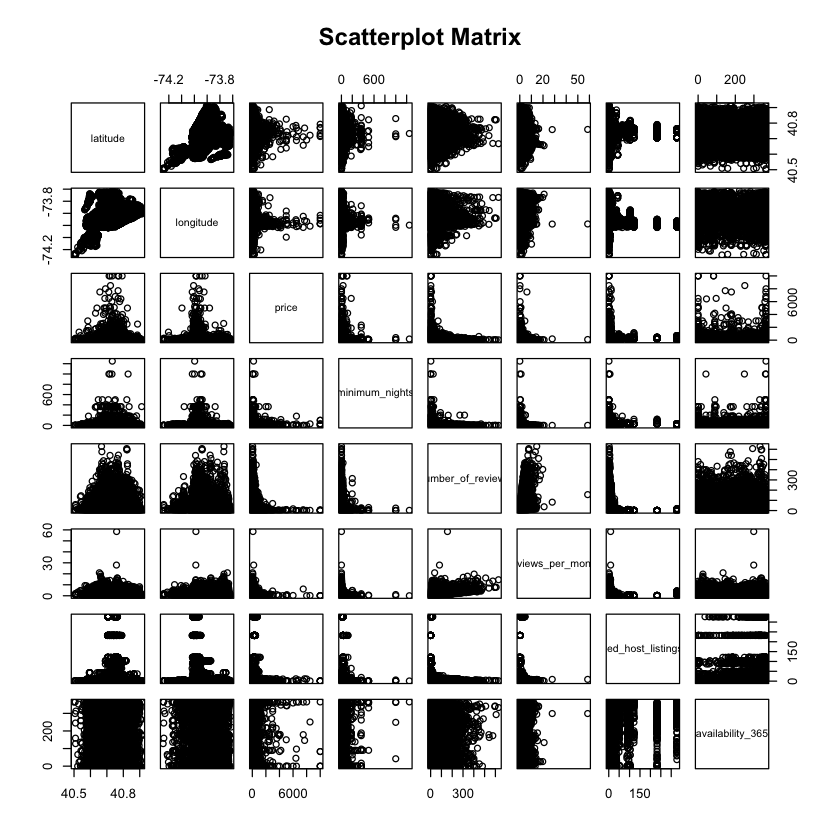

In [10]:
# visualization of relationships between variables
pairs(airbnb[, sapply(airbnb, is.numeric)], main = "Scatterplot Matrix")


### 2.4 Advanced Statistical Analysis


In [11]:
# partial correlations
library(ppcor)
numeric_vars <- airbnb[, sapply(airbnb, is.numeric)]
numeric_vars_clean <- na.omit(numeric_vars)
var_cols <- apply(numeric_vars_clean, 2, var)
numeric_vars_clean <- numeric_vars_clean[, var_cols > 0]
pcor(numeric_vars_clean)$estimate

# partial correlation with the response price
t(data.frame(p = pcor(numeric_vars_clean, method = "pearson")$estimate[1, -1]))


Loading required package: MASS



,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.000000000,0.10184893,0.0483752576,0.0304981060,0.006272811,-0.0136299994,0.01679294,-0.03930321
longitude,0.101848930,1.00000000,-0.1626849332,-0.0462874609,-0.056471580,0.1263230178,-0.10882593,0.12399700
price,0.048375258,-0.16268493,1.0000000000,0.0004613146,-0.038188423,0.0002635546,0.01560522,0.09788645
minimum_nights,0.030498106,-0.04628746,0.0004613146,1.0000000000,-0.015340409,-0.1064024291,0.04300309,0.12109450
number_of_reviews,0.006272811,-0.05647158,-0.0381884233,-0.0153404093,1.000000000,0.5279626908,-0.09207365,0.13444866
reviews_per_month,-0.013629999,0.12632302,0.0002635546,-0.1064024291,0.527962691,1.0000000000,0.02883724,0.08907333
calculated_host_listings_count,0.016792940,-0.10882593,0.0156052220,0.0430030879,-0.092073652,0.0288372383,1.00000000,0.19723555
availability_365,-0.039303215,0.12399700,0.0978864534,0.1210944960,0.134448657,0.0890733286,0.19723555,1.00000000


,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
p,0.1018489,0.04837526,0.03049811,0.006272811,-0.01363,0.01679294,-0.03930321


In [12]:
# VIF for multicollinearity
library(car)
vif_model <- lm(price ~ room_type + number_of_reviews + availability_365, data = airbnb)
vif(vif_model)


Loading required package: carData



,GVIF,Df,GVIF^(1/(2*Df))
room_type,1.004793,2,1.001196
number_of_reviews,1.031909,1,1.015829
availability_365,1.034666,1,1.017185


In [13]:
# number of NAs in each selected covariate
num_na <- sapply(X, function(x) sum(is.na(x)))
num_na


room_type number_of_reviews  availability_365 
                0                 0                 0

## 3. Model Building and Analysis

### 3.1 Performance Tracking


In [14]:
# Create a dataframe to track model performance metrics
model_performance <- data.frame(model_name = c(), r_squared = c(), adjusted_r_squared = c())


### 3.2 Basic Linear Models


In [15]:
# Linear models with single predictors
lm_type <- lm(price ~ room_type, data = airbnb)
lm_num_reviews <- lm(price ~ number_of_reviews, data = airbnb)
lm_availability <- lm(price ~ availability_365, data = airbnb)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_type",
        r_squared = summary(lm_type)$r.squared,
        adjusted_r_squared = summary(lm_type)$adj.r.squared
    )
)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_num_reviews",
        r_squared = summary(lm_num_reviews)$r.squared,
        adjusted_r_squared = summary(lm_num_reviews)$adj.r.squared
    )
)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_availability",
        r_squared = summary(lm_availability)$r.squared,
        adjusted_r_squared = summary(lm_availability)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641


In [16]:
# Linear model with all predictors (additive)
lm_all <- lm(price ~ room_type + number_of_reviews + availability_365, data = airbnb)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_all",
        r_squared = summary(lm_all)$r.squared,
        adjusted_r_squared = summary(lm_all)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344


In [17]:
# Linear model with interaction terms
lm_interaction <- lm(price ~ room_type * number_of_reviews * availability_365, data = airbnb)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_interaction",
        r_squared = summary(lm_interaction)$r.squared,
        adjusted_r_squared = summary(lm_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879


### 3.3 Model Diagnostics


In [18]:
# Examine residuals of the interaction model
res <- residuals(lm_interaction)
res |> summary()


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-283.59  -56.93  -25.76    0.00   11.00 9917.00 

`geom_smooth()` using formula = 'y ~ x'


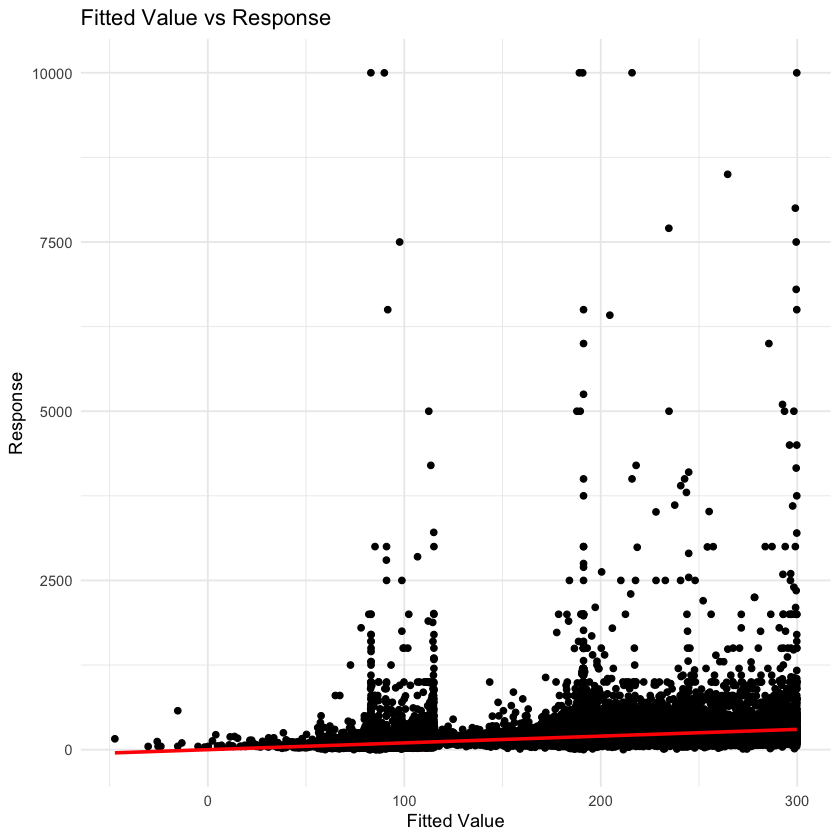

In [19]:
# Fitted value vs response
ggplot(data = airbnb, aes(x = fitted(lm_interaction), y = price)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "Fitted Value vs Response", x = "Fitted Value", y = "Response") +
  theme_minimal()


`geom_smooth()` using formula = 'y ~ x'


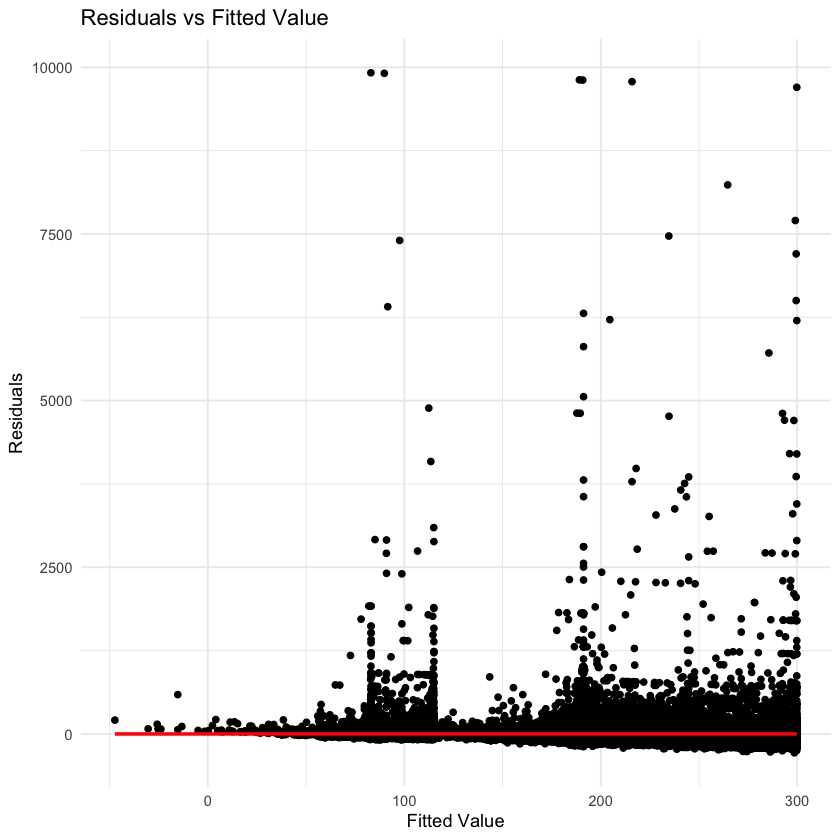

In [20]:
# Residuals vs fitted value
ggplot(data = airbnb, aes(x = fitted(lm_interaction), y = res)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "Residuals vs Fitted Value", x = "Fitted Value", y = "Residuals") +
  theme_minimal()


`geom_smooth()` using formula = 'y ~ x'


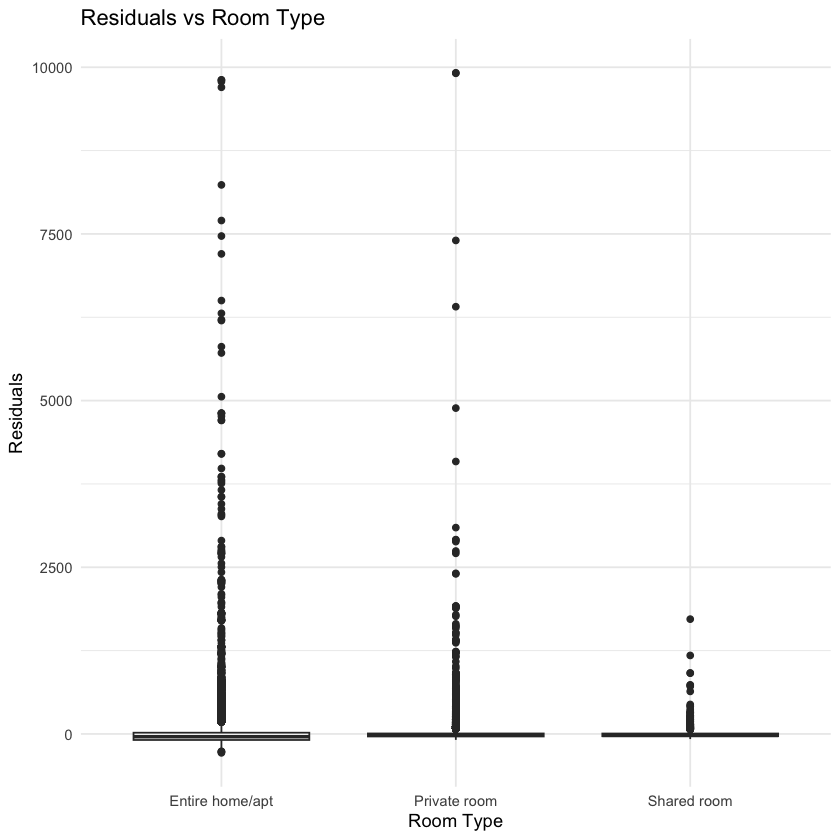

`geom_smooth()` using formula = 'y ~ x'


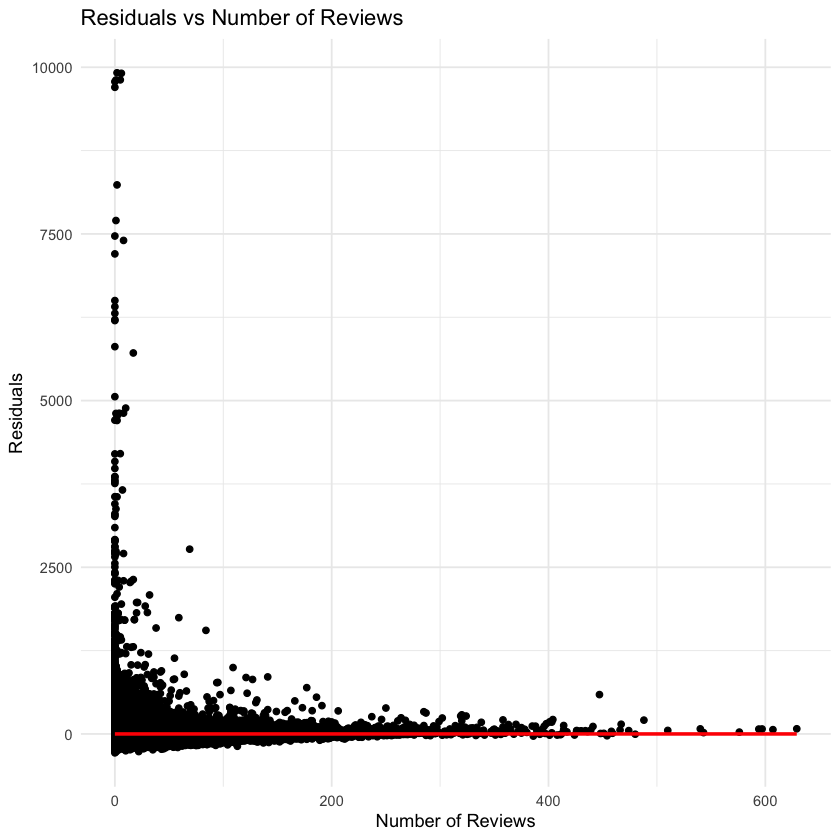

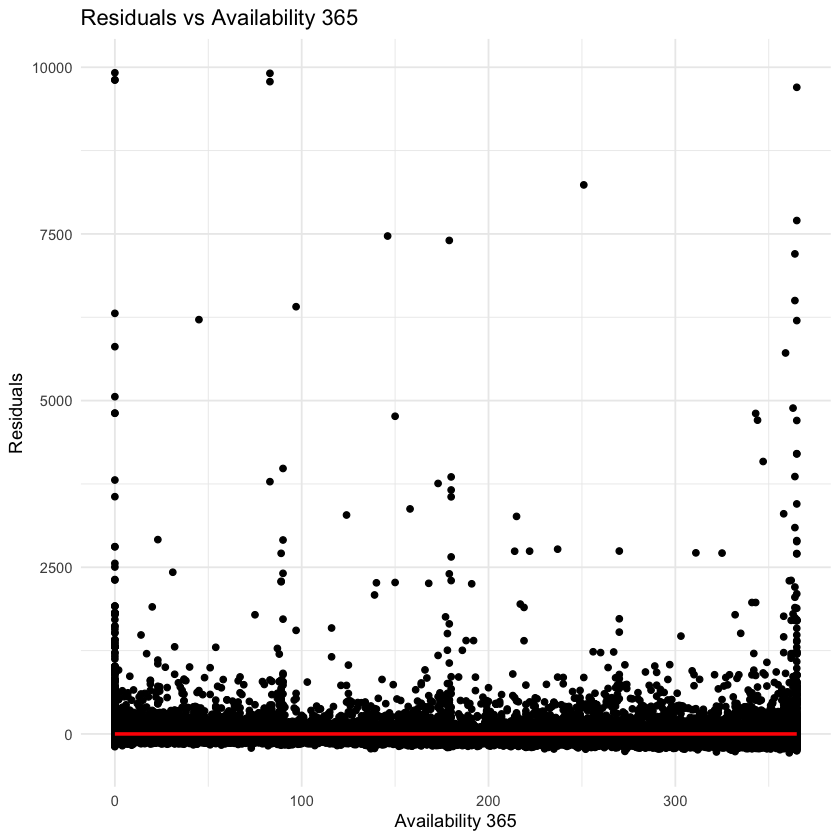

In [21]:
# Residuals vs each covariate
ggplot(data = airbnb, aes(x = room_type, y = res)) +
  geom_boxplot() +
  labs(title = "Residuals vs Room Type", x = "Room Type", y = "Residuals") +
  theme_minimal()
ggplot(data = airbnb, aes(x = number_of_reviews, y = res)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "Residuals vs Number of Reviews", x = "Number of Reviews", y = "Residuals") +
  theme_minimal()
ggplot(data = airbnb, aes(x = availability_365, y = res)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "Residuals vs Availability 365", x = "Availability 365", y = "Residuals") +
  theme_minimal()


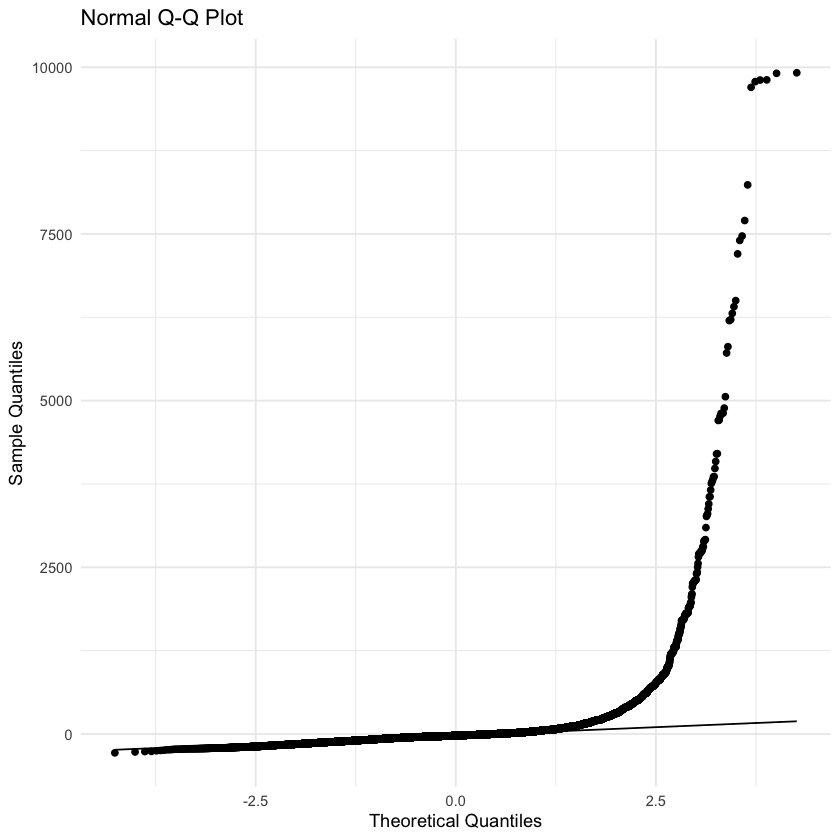

In [22]:
# Normal qq plot
ggplot(data = airbnb, aes(sample = res)) +
  stat_qq() +
  stat_qq_line() +
  labs(title = "Normal Q-Q Plot", x = "Theoretical Quantiles", y = "Sample Quantiles") +
  theme_minimal()


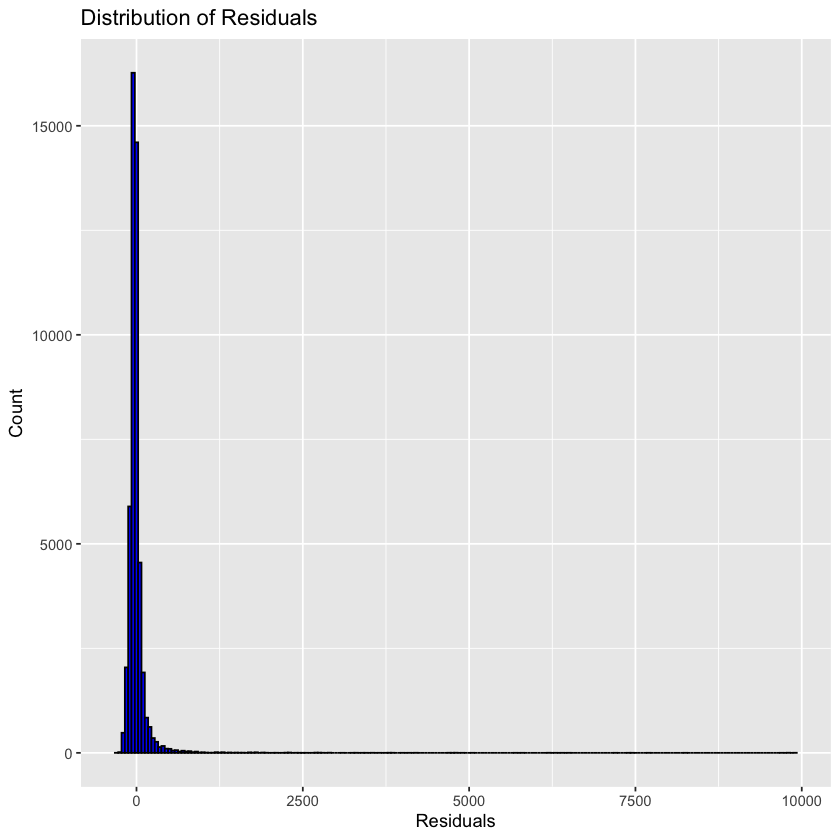

In [23]:
# Distribution of residuals
ggplot(data = airbnb, aes(x = res)) +
  geom_histogram(binwidth = 50, fill = "blue", color = "black") +
  labs(title = "Distribution of Residuals", x = "Residuals", y = "Count")


## 3.4 Model Transformations

The QQ plot suggests the assumptions are violated and the adjusted $R^2$s are low. Let's try transforming the data to improve model assumptions.


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  2.303   4.234   4.663   4.727   5.165   9.210 

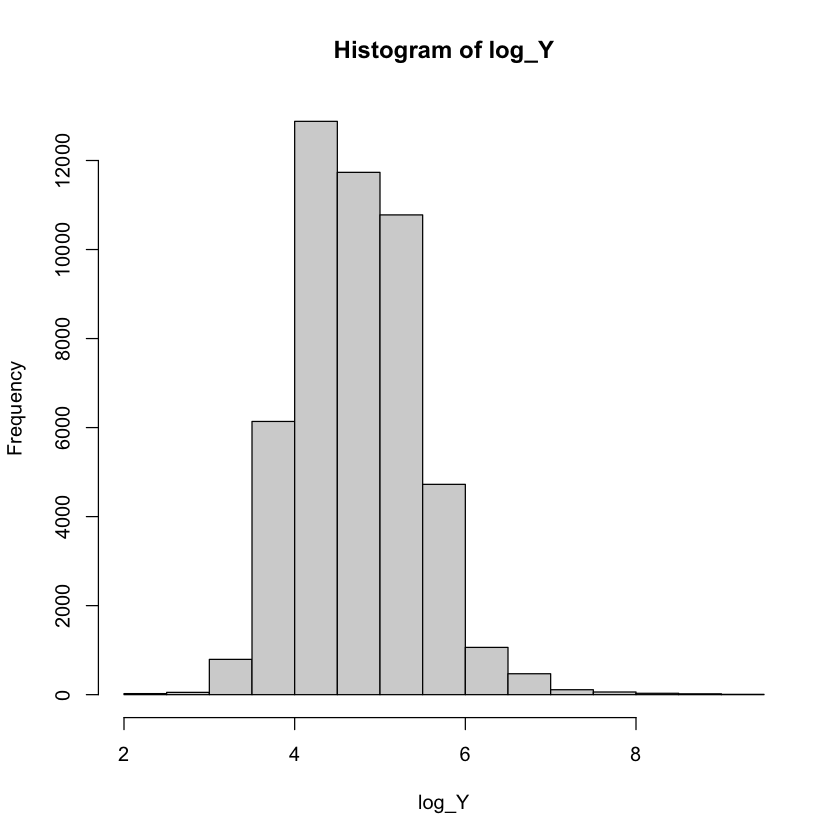

In [24]:
# Remove 0 prices to enable log transformation
airbnb <- airbnb[airbnb$price > 0, ]
log_Y <- log(airbnb$price)
hist(log_Y)
summary(log_Y)


In [25]:
# Log-transformed response models
lm_log_y <- lm(log(price) ~ room_type + number_of_reviews + availability_365, data = airbnb)
lm_log_y_interaction <- lm(log(price) ~ room_type * number_of_reviews * availability_365, data = airbnb)

model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y",
        r_squared = summary(lm_log_y)$r.squared,
        adjusted_r_squared = summary(lm_log_y)$adj.r.squared
    )
)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_interaction",
        r_squared = summary(lm_log_y_interaction)$r.squared,
        adjusted_r_squared = summary(lm_log_y_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103


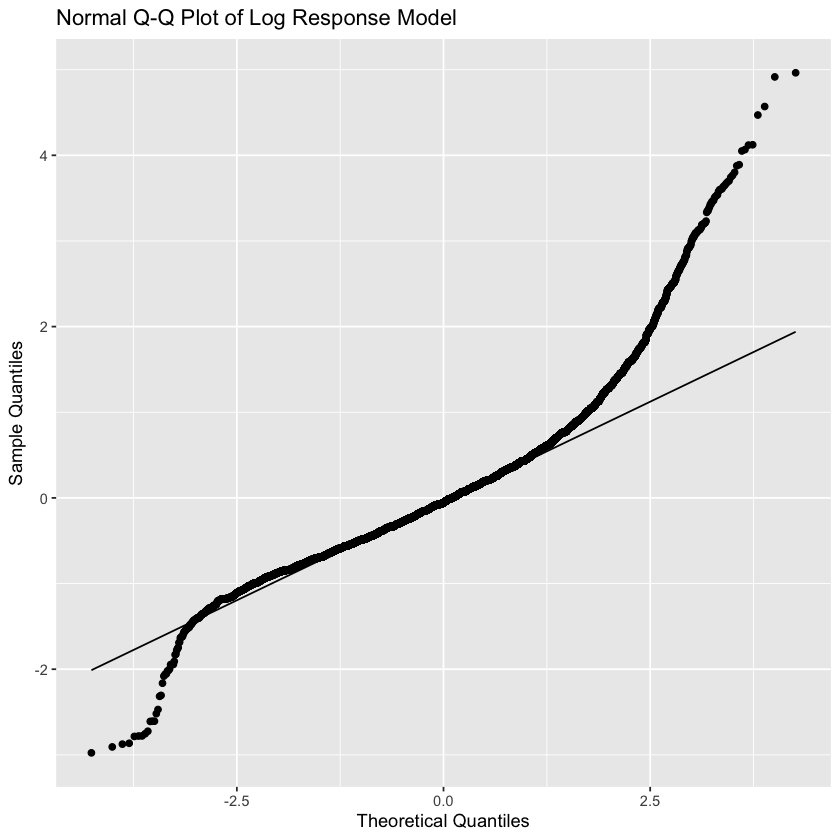

In [26]:
# QQ plot of log-transformed model
ggplot(data = airbnb, aes(sample = residuals(lm_log_y))) +
    stat_qq() +
    stat_qq_line() +
    labs(title = "Normal Q-Q Plot of Log Response Model", x = "Theoretical Quantiles", y = "Sample Quantiles")


In [27]:
# Replace 0 with small value (0.0001) in predictors for log transformation
airbnb_transformed <- airbnb
airbnb_transformed$number_of_reviews <- pmax(airbnb_transformed$number_of_reviews, 0.0001)
airbnb_transformed$availability_365 <- pmax(airbnb_transformed$availability_365, 0.0001)


In [28]:
# Log-transformed response and predictors
lm_log_y_log_x <- lm(log(price) ~ log(number_of_reviews) + log(availability_365) + room_type, data = airbnb_transformed)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_log_x",
        r_squared = summary(lm_log_y_log_x)$r.squared,
        adjusted_r_squared = summary(lm_log_y_log_x)$adj.r.squared
    )
)

# With interactions
lm_log_y_log_x_interaction <- lm(log(price) ~ log(number_of_reviews) * log(availability_365) * room_type, data = airbnb_transformed)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_log_x_interaction",
        r_squared = summary(lm_log_y_log_x_interaction)$r.squared,
        adjusted_r_squared = summary(lm_log_y_log_x_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


### Double log transformation for response


In [29]:
# Double log transformation of response variable
lm_log_log_y_log_x <- lm(log(log(price)) ~ log(number_of_reviews) + log(availability_365) + room_type, data = airbnb_transformed)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_log_y_log_x",
        r_squared = summary(lm_log_log_y_log_x)$r.squared,
        adjusted_r_squared = summary(lm_log_log_y_log_x)$adj.r.squared
    )
)

# With interactions
lm_log_log_y_log_x_interaction <- lm(log(log(price)) ~ log(number_of_reviews) * log(availability_365) * room_type, data = airbnb_transformed)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_log_y_log_x_interaction",
        r_squared = summary(lm_log_log_y_log_x_interaction)$r.squared,
        adjusted_r_squared = summary(lm_log_log_y_log_x_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


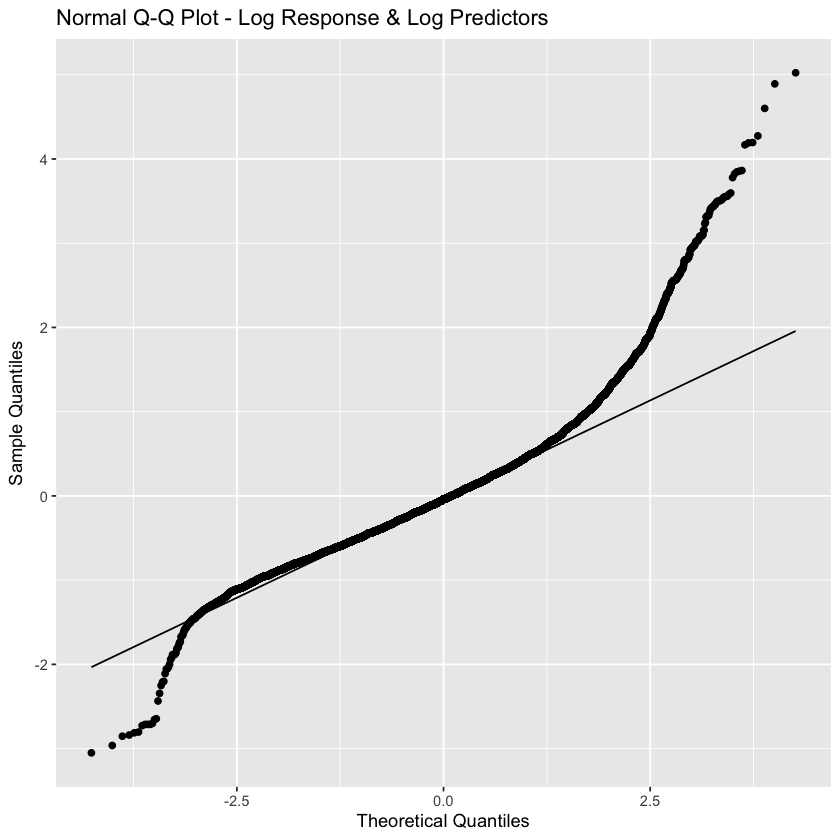

In [30]:
# QQ plot for log-log transformation
ggplot(data = airbnb, aes(sample = residuals(lm_log_y_log_x))) +
    stat_qq() +
    stat_qq_line() +
    labs(title = "Normal Q-Q Plot - Log Response & Log Predictors", x = "Theoretical Quantiles", y = "Sample Quantiles")


### Model diagnostics for log-transformed model


`geom_smooth()` using formula = 'y ~ x'


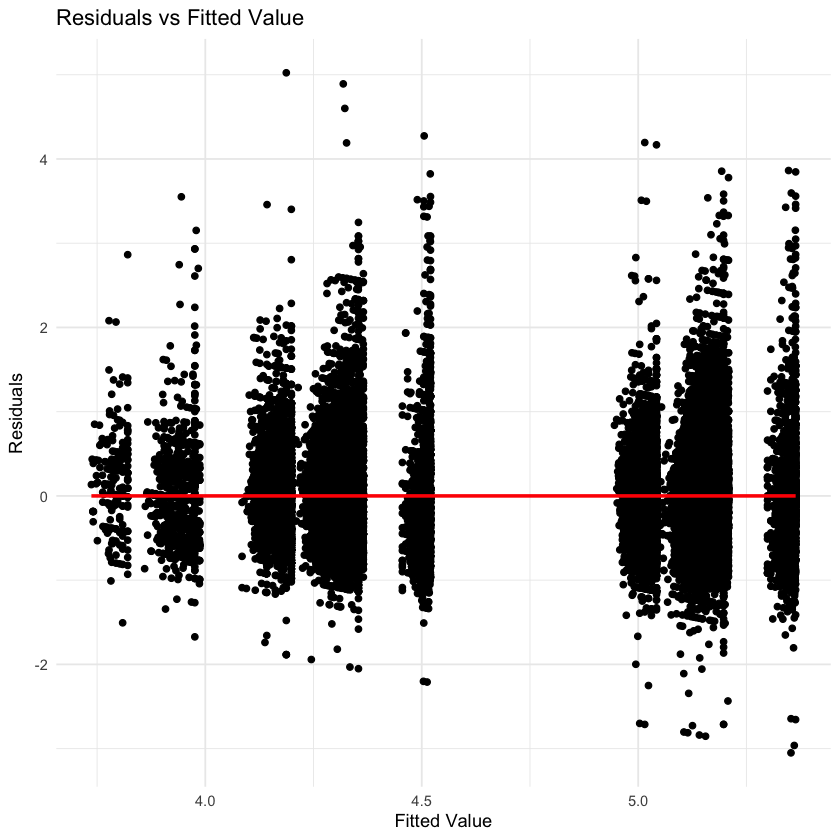

In [31]:
# Residuals vs fitted values
ggplot(data = airbnb, aes(x = fitted(lm_log_y_log_x), y = residuals(lm_log_y_log_x))) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "Residuals vs Fitted Value", x = "Fitted Value", y = "Residuals") +
  theme_minimal()


`geom_smooth()` using formula = 'y ~ x'


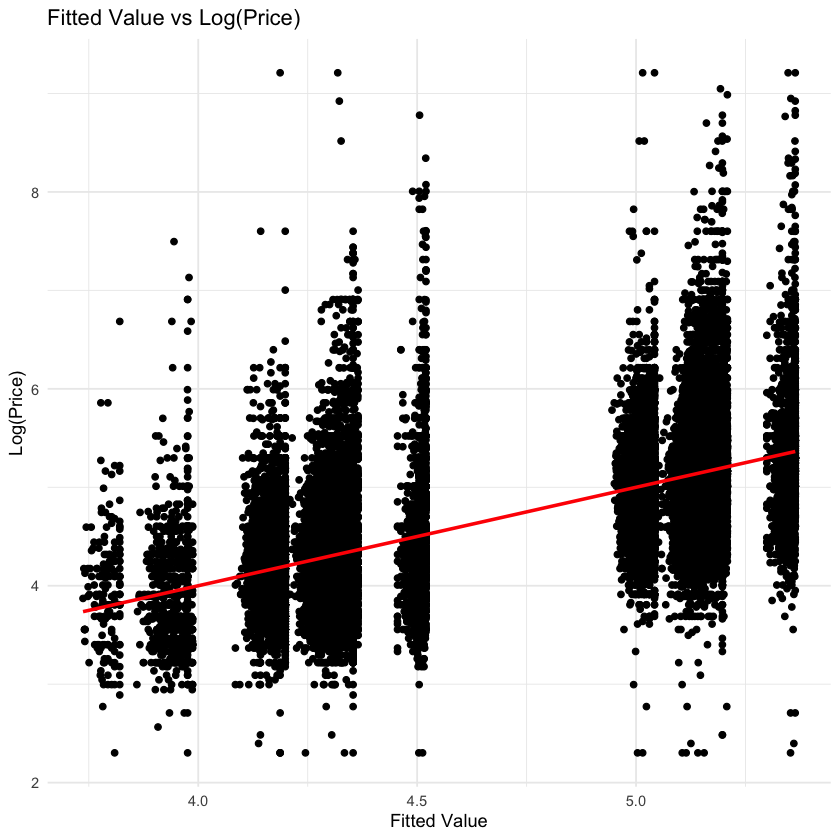

In [32]:
# Fitted values vs response
ggplot(data = airbnb_transformed, aes(x = fitted(lm_log_y_log_x), y = log(price))) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "red") +
  labs(title = "Fitted Value vs Log(Price)", x = "Fitted Value", y = "Log(Price)") +
  theme_minimal()


In [33]:
# full model
lm_full <- lm(price ~ ., data = airbnb)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_full",
        r_squared = summary(lm_full)$r.squared,
        adjusted_r_squared = summary(lm_full)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


In [34]:
lm_full_log_y <- lm(log(price) ~ ., data = airbnb)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_full_log_y",
        r_squared = summary(lm_full_log_y)$r.squared,
        adjusted_r_squared = summary(lm_full_log_y)$adj.r.squared
    )
)

model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


In [35]:
lm_log_y_plus_one <- lm(log(price + 1) ~ number_of_reviews * availability_365 * room_type, data = airbnb)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_plus_one",
        r_squared = summary(lm_log_y_plus_one)$r.squared,
        adjusted_r_squared = summary(lm_log_y_plus_one)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


# Model Diagnostic Function

Define a function to evaluate each model with standardized residuals and diagnostic plots.


In [36]:
evaluate_model <- function(model, model_name) {
  # 1. Calculate standardized residuals
  std_res <- rstandard(model)

  # Create a data frame for plotting
  plot_data <- data.frame(
    response = model$model[, 1], # Extracting the response variable
    fitted = fitted(model),
    std_residuals = std_res
  )

  # 2. Plot responses vs fitted values
  p1 <- ggplot(plot_data, aes(x = fitted, y = response)) +
    geom_point(alpha = 0.5) +
    geom_abline(slope = 1, intercept = 0, color = "red", linetype = "dashed") +
    labs(
      title = paste("Response vs Fitted Values -", model_name),
      x = "Fitted Values", y = "Response"
    ) +
    theme_minimal()
  print(p1)

  # 3. Plot outliers based on standardized residuals > 3 or < -3
  outliers <- which(abs(std_res) > 3)
  n_outliers <- length(outliers)

  p2 <- ggplot(plot_data, aes(x = fitted, y = std_residuals)) +
    geom_point(alpha = 0.5) +
    geom_hline(yintercept = 0, color = "black", linetype = "solid") +
    geom_hline(yintercept = c(-3, 3), color = "red", linetype = "dashed") +
    labs(
      title = paste("Standardized Residuals -", model_name, "(", n_outliers, "outliers)"),
      x = "Fitted Values", y = "Standardized Residuals"
    ) +
    theme_minimal()

  if (n_outliers > 0) {
    p2 <- p2 + geom_point(
      data = plot_data[outliers, ],
      aes(x = fitted, y = std_residuals),
      color = "red", size = 3
    )
  }
  print(p2)

  # 4. QQ plot of standardized residuals
  p3 <- ggplot(plot_data, aes(sample = std_residuals)) +
    stat_qq() +
    stat_qq_line() +
    labs(
      title = paste("Normal Q-Q Plot -", model_name),
      x = "Theoretical Quantiles", y = "Sample Quantiles"
    ) +
    theme_minimal()
  print(p3)

  return(list(
    model_name = model_name,
    outliers = n_outliers,
    mean_std_res = mean(std_res, na.rm = TRUE),
    sd_std_res = sd(std_res, na.rm = TRUE)
  ))
}


# Evaluating Each Model


In [37]:
eval_results <- data.frame(
    model_name = character(),
    outliers = numeric(),
    mean_std_res = numeric(),
    sd_std_res = numeric()
)


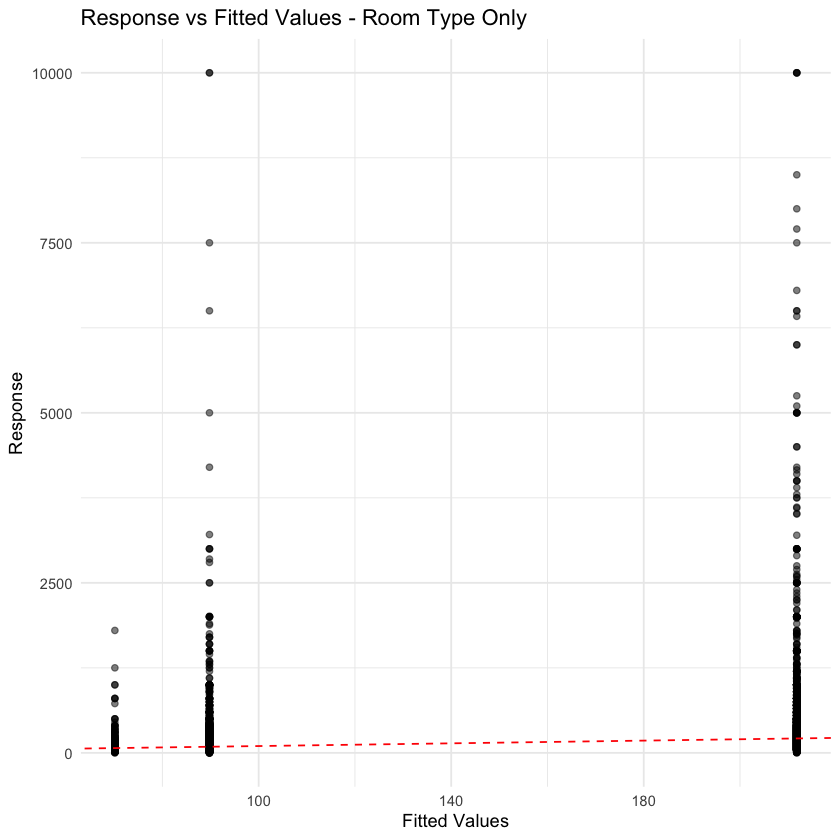

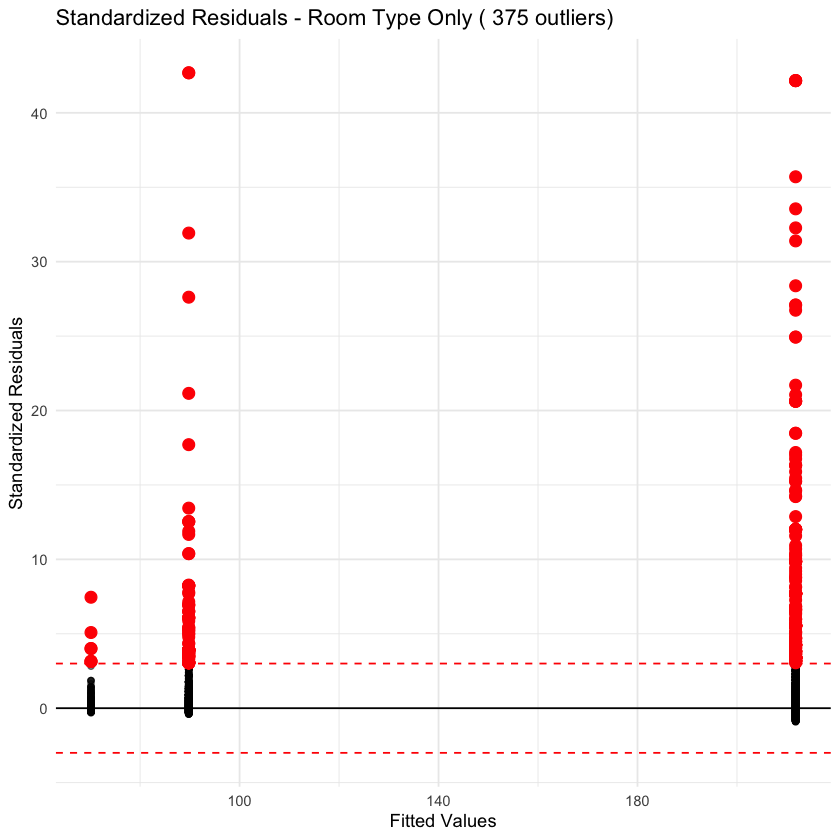

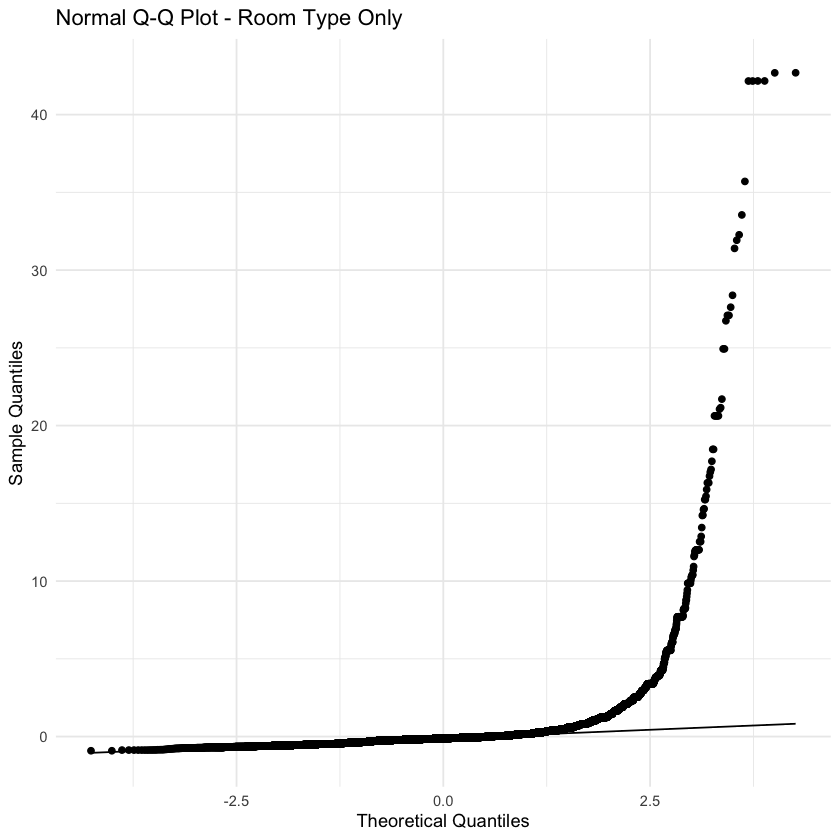

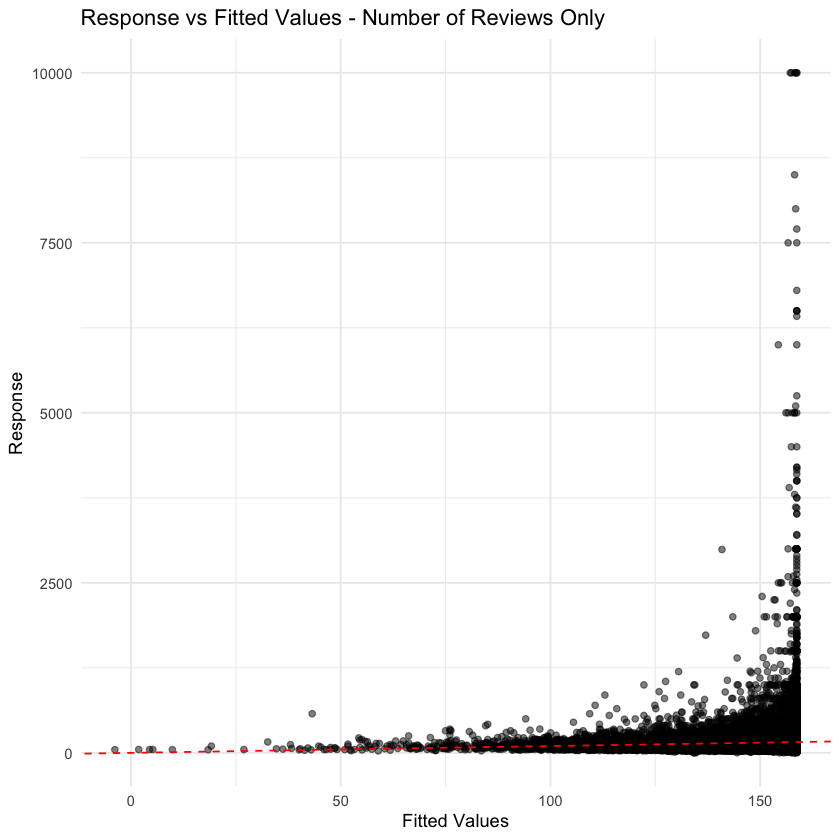

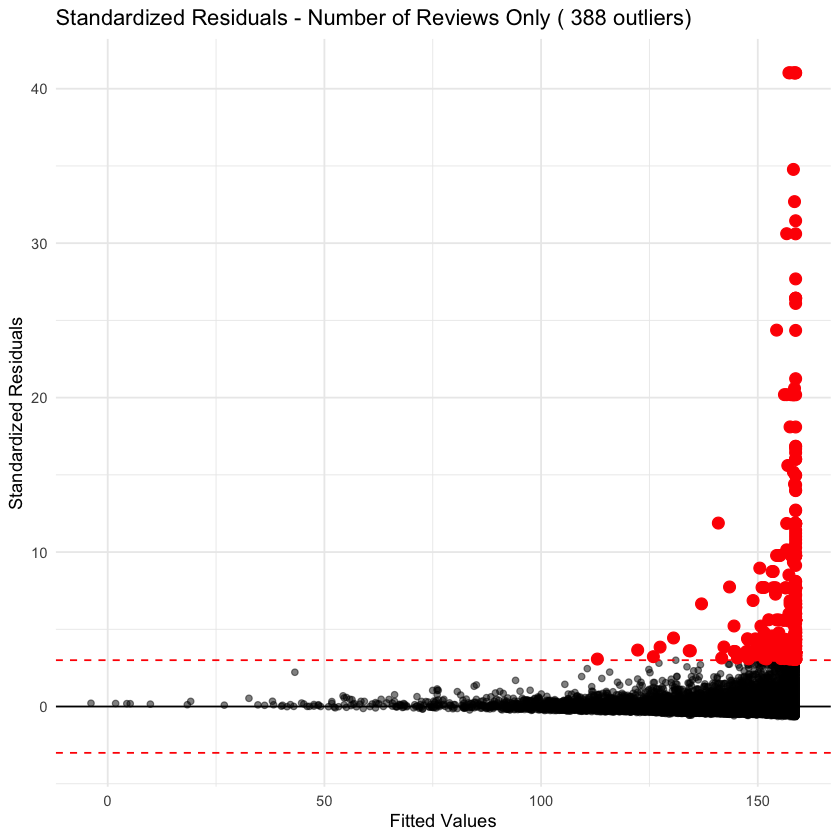

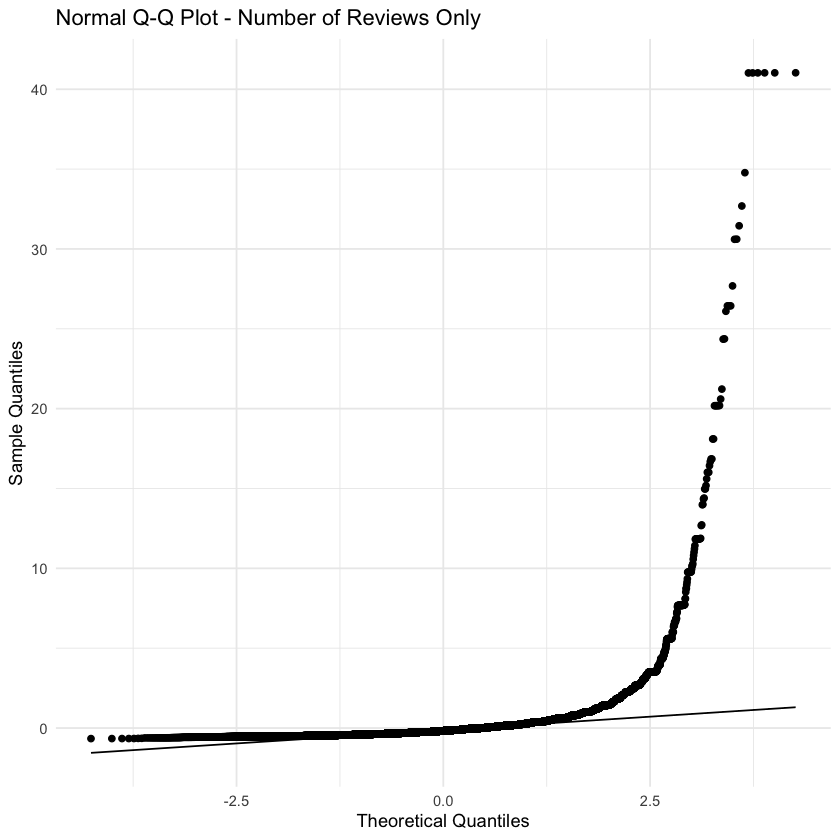

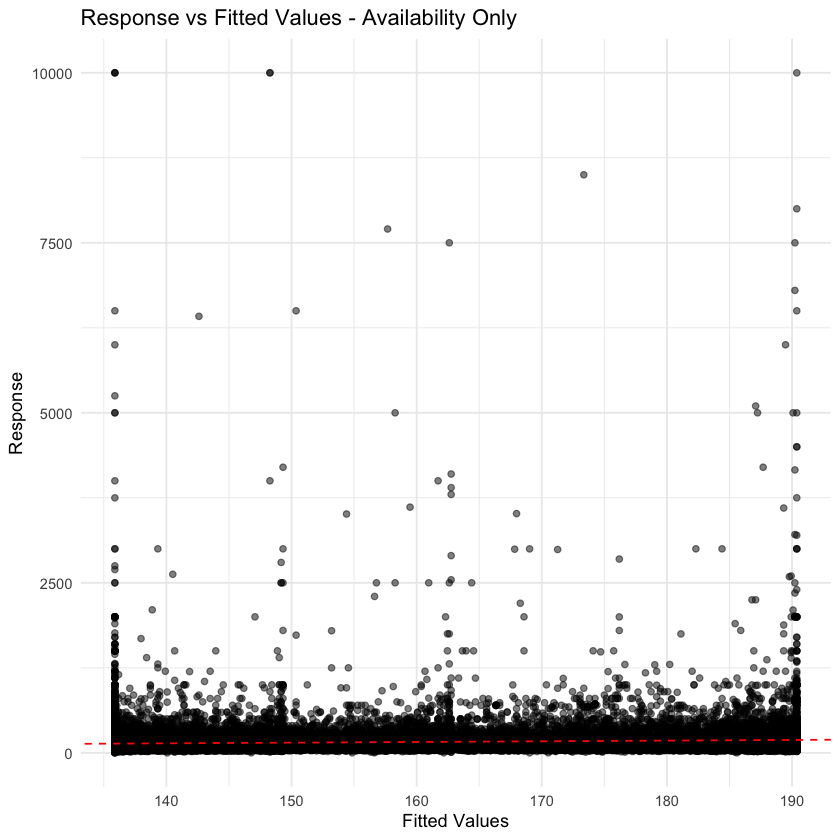

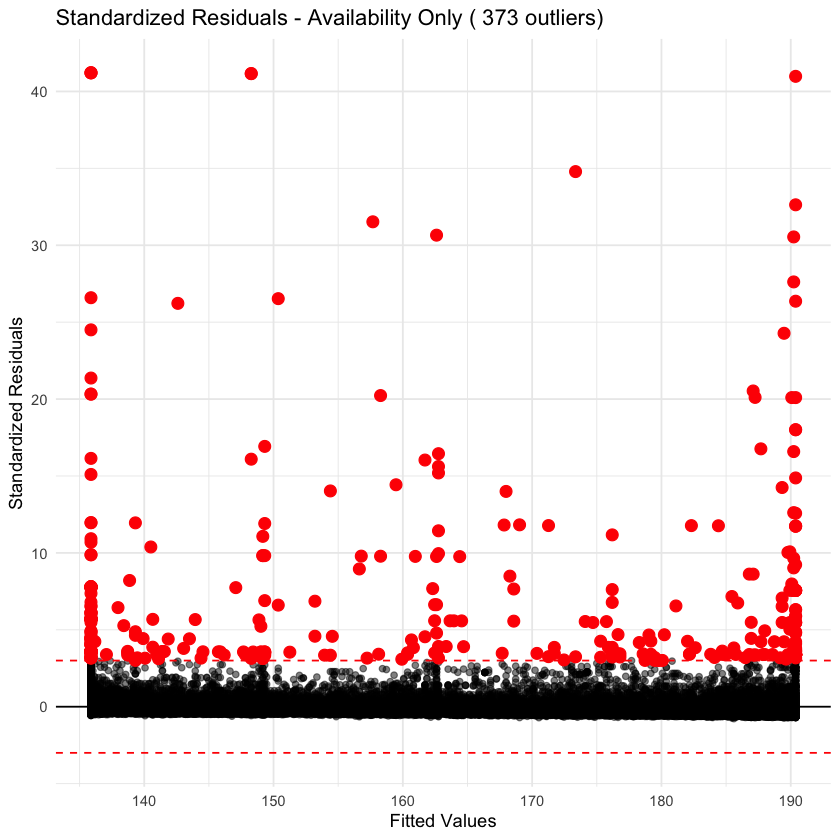

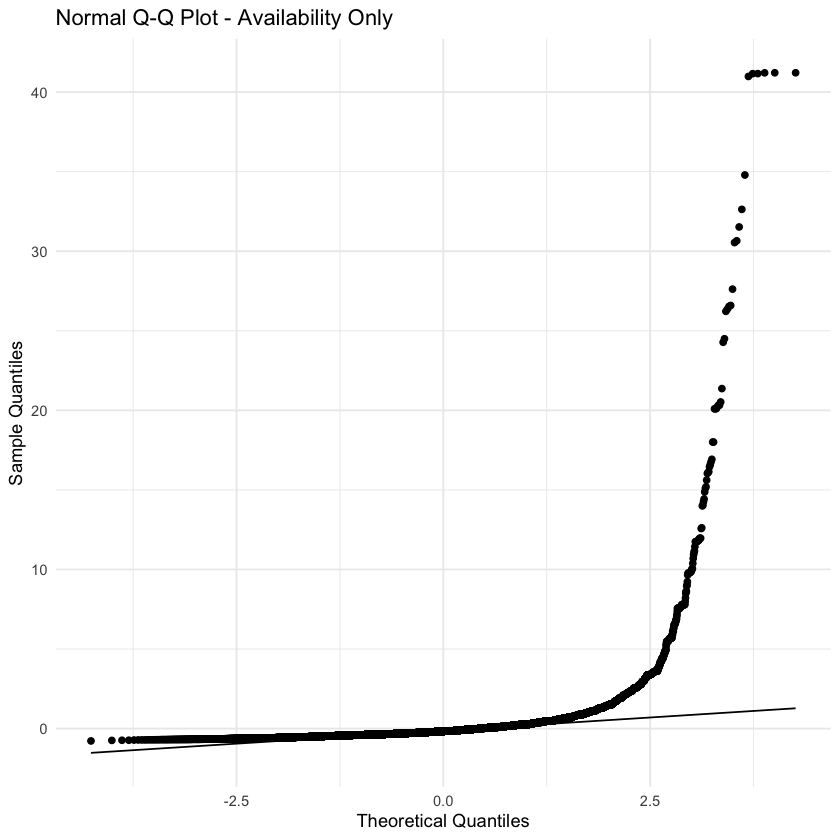

In [38]:
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_type, "Room Type Only")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_num_reviews, "Number of Reviews Only")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_availability, "Availability Only")))


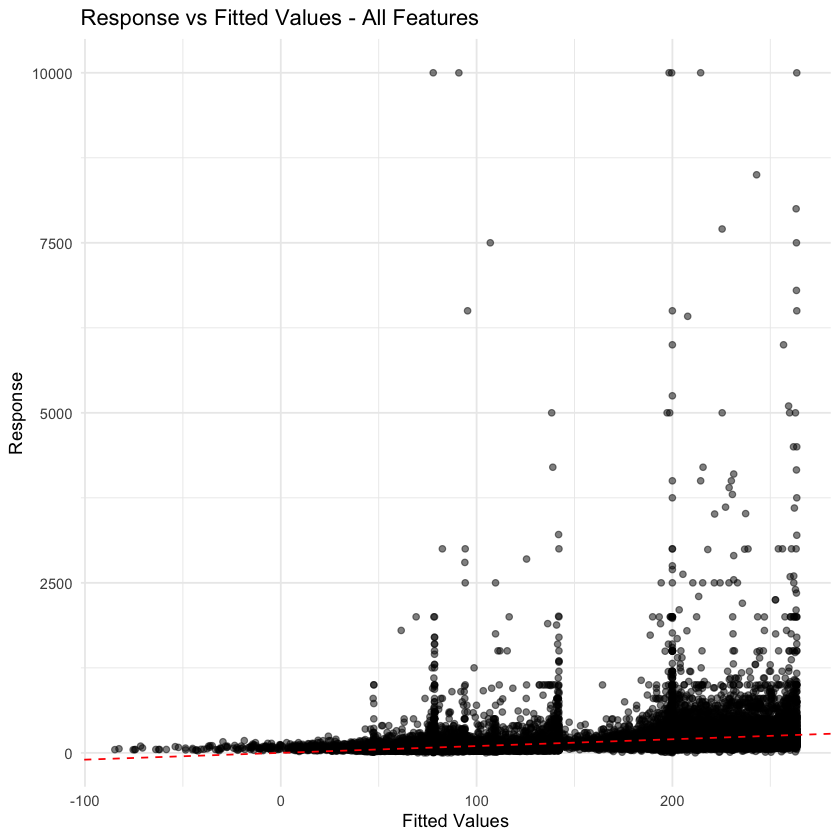

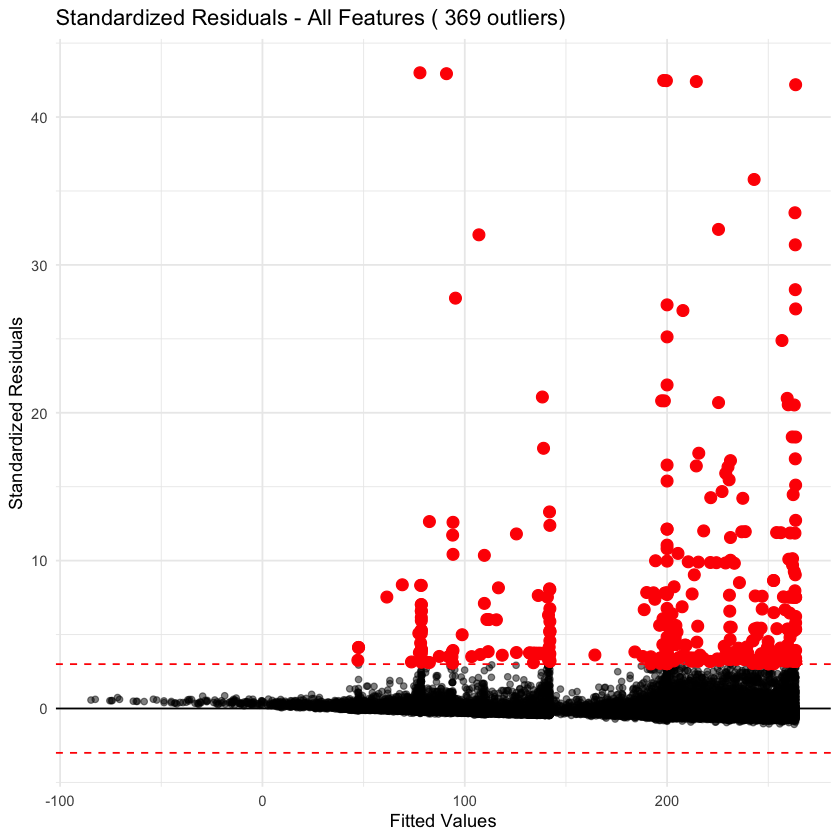

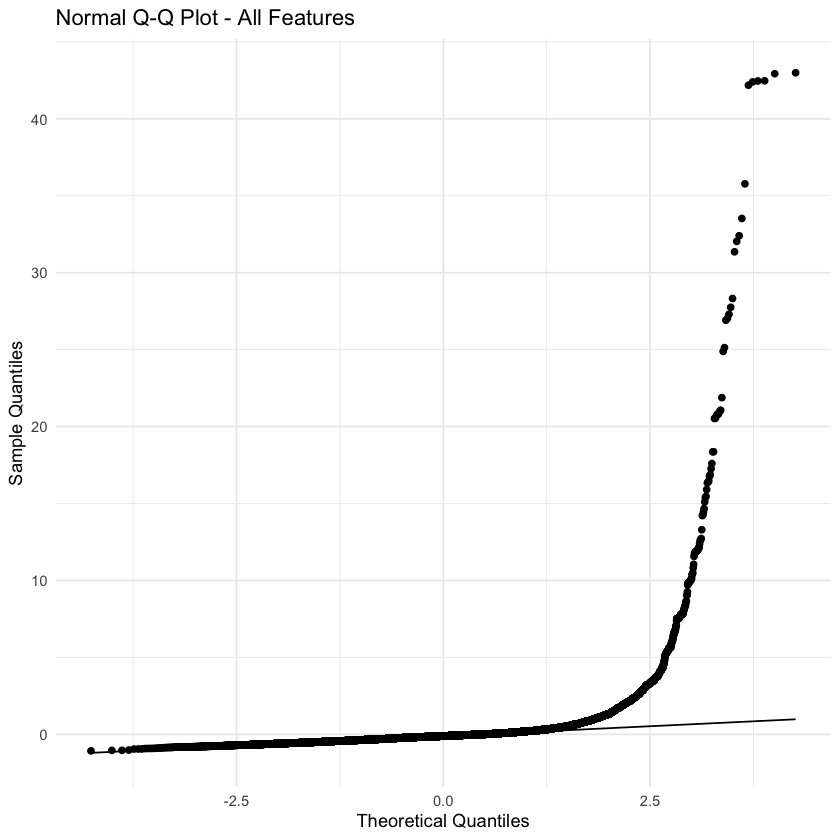

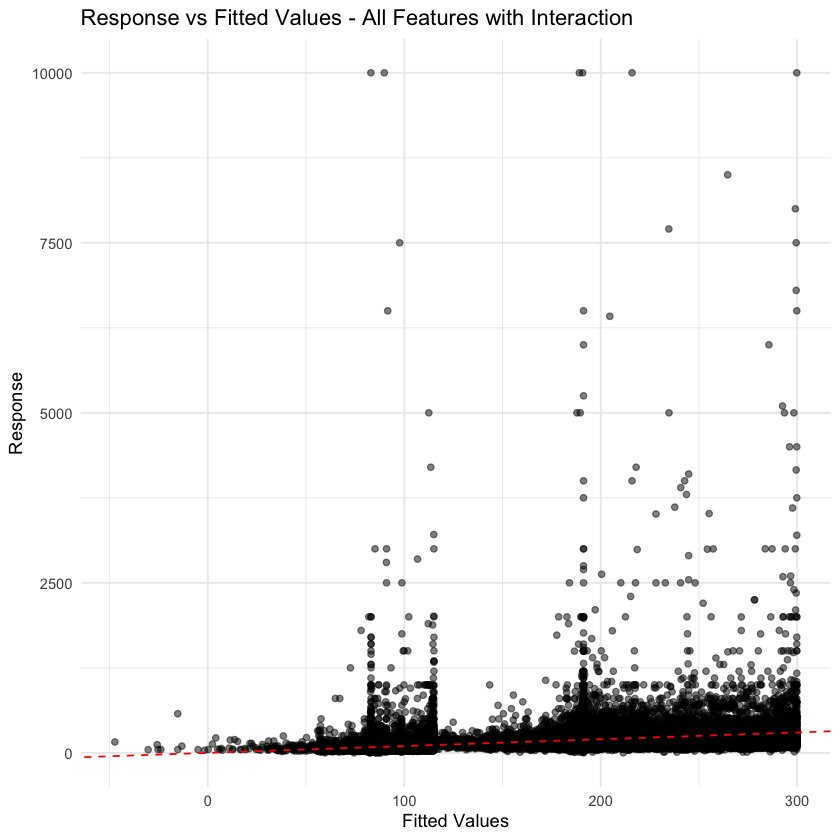

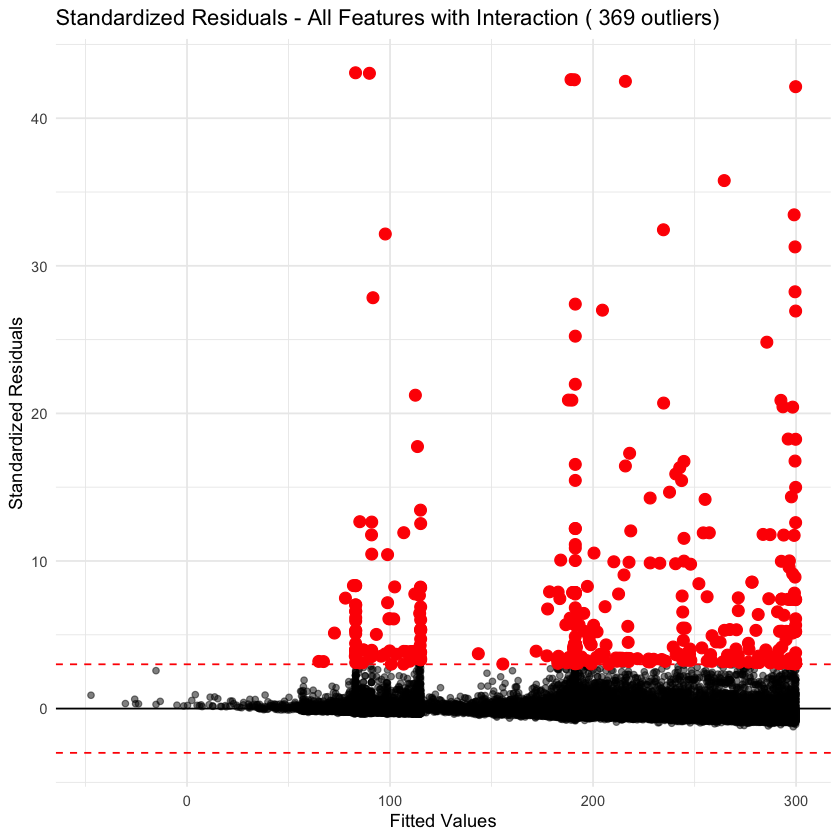

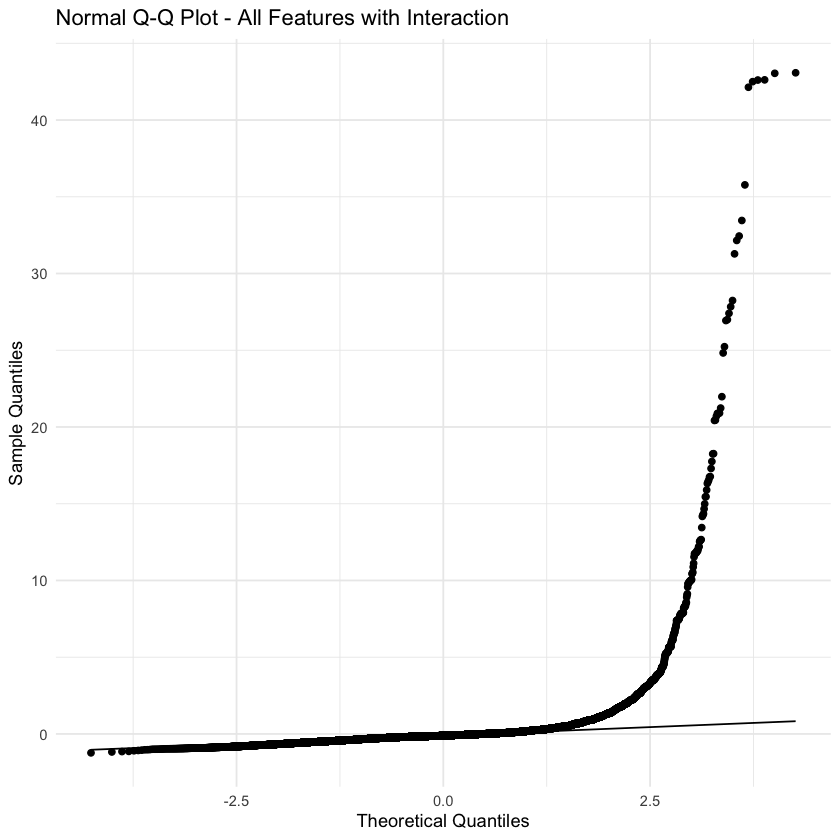

In [39]:
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_all, "All Features")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_interaction, "All Features with Interaction")))


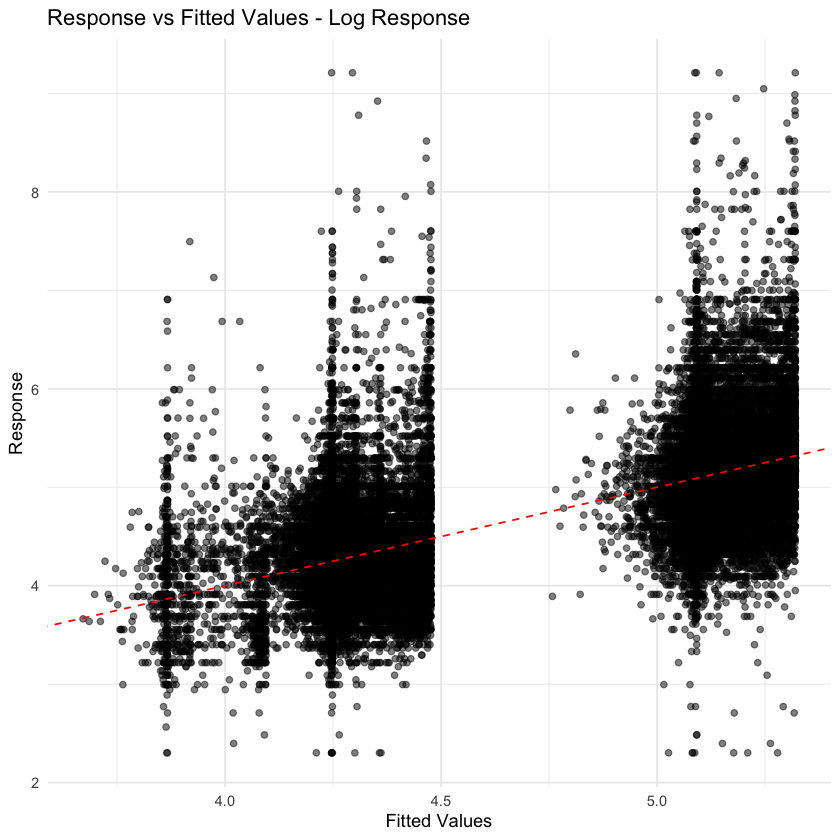

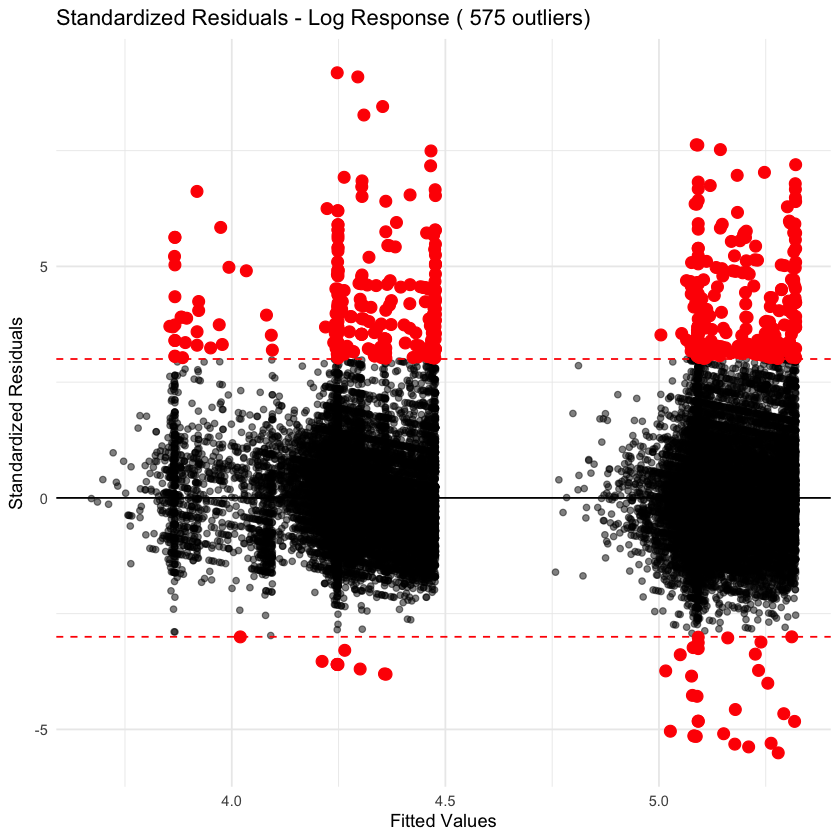

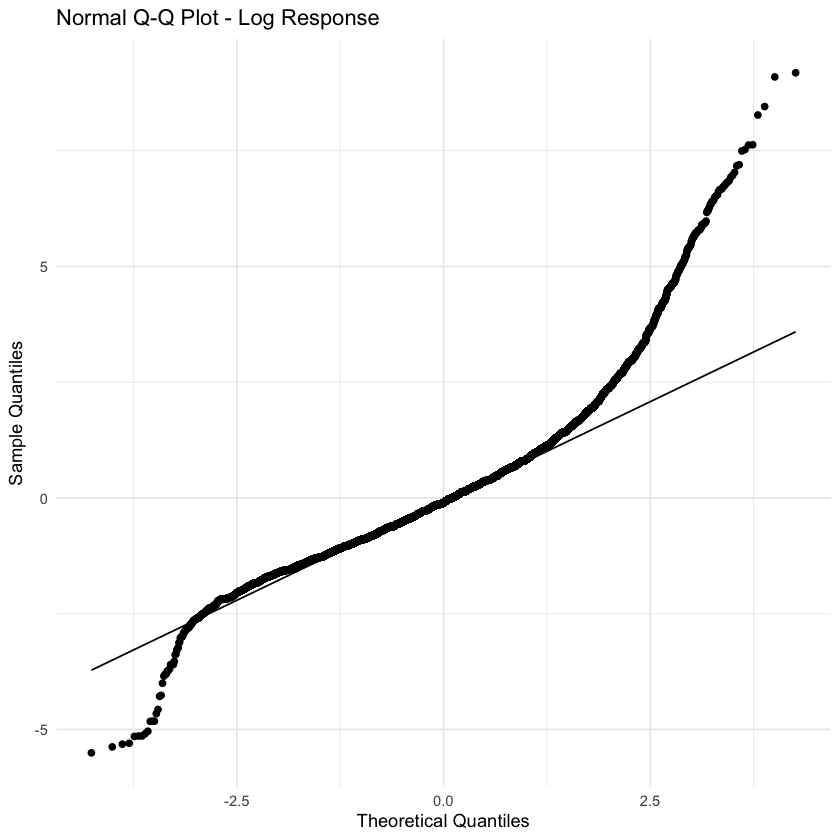

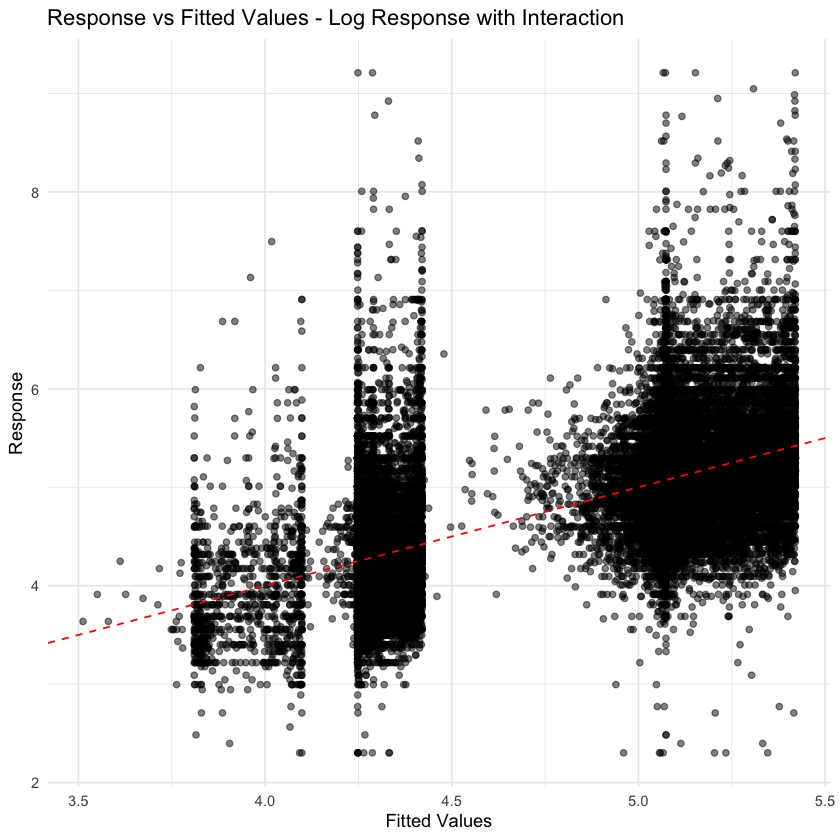

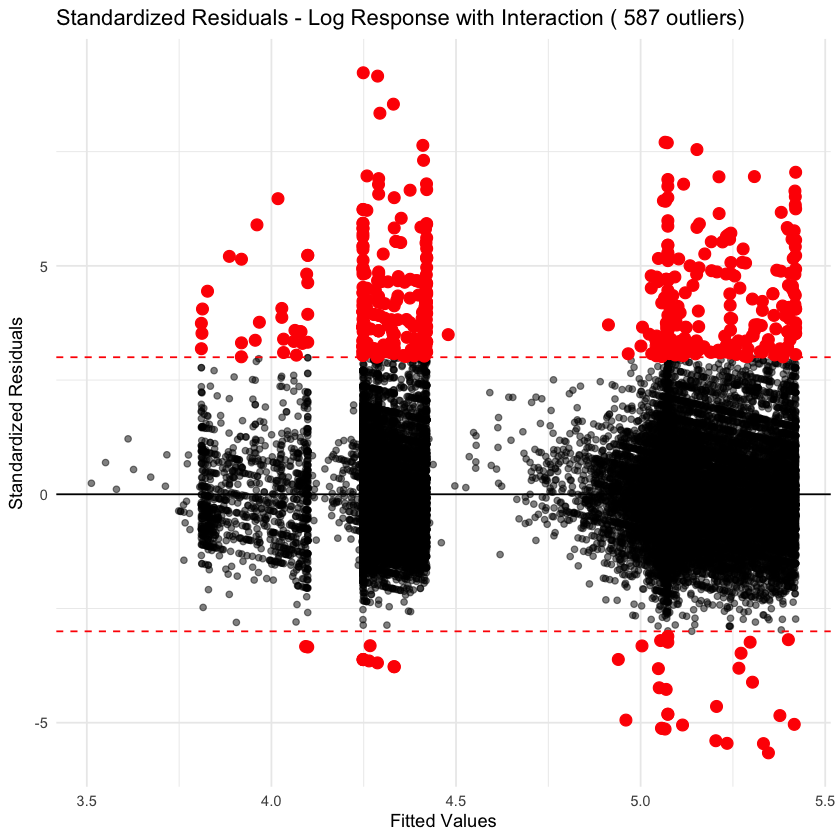

...

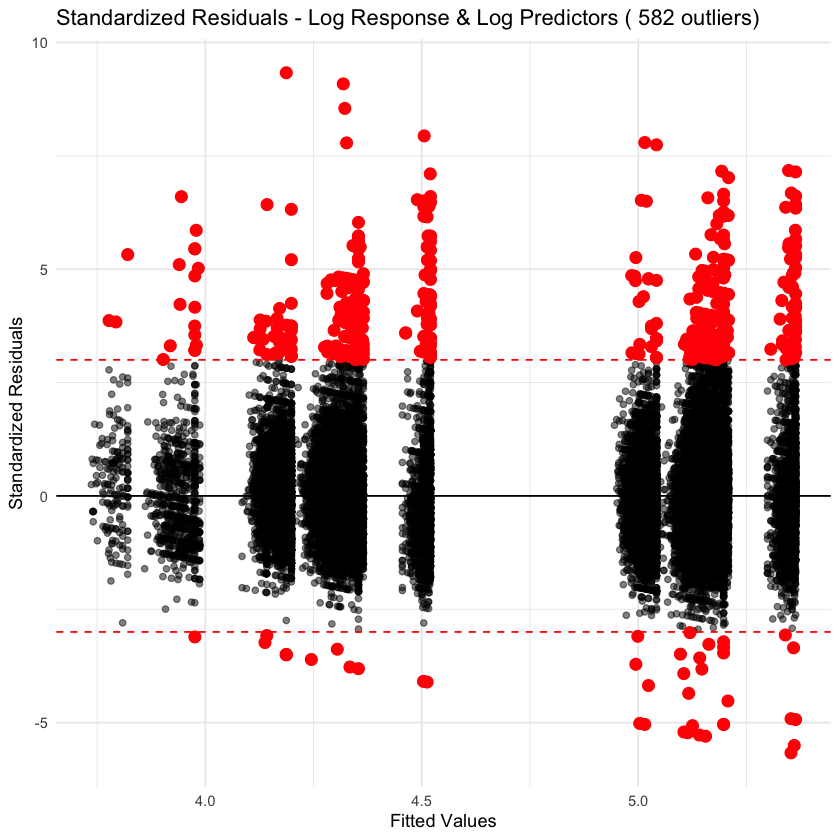

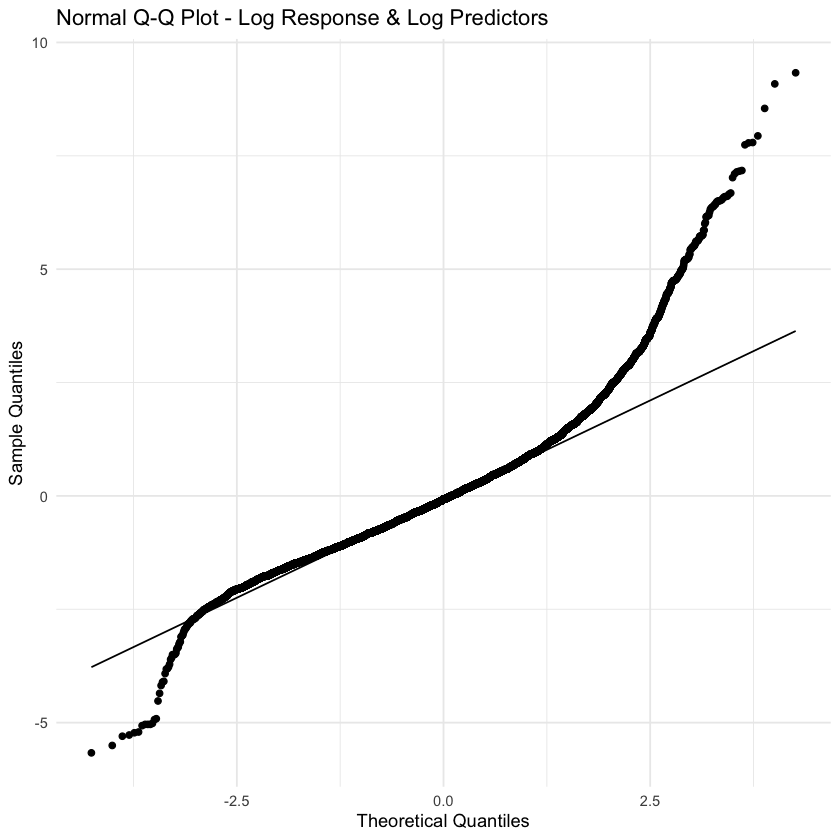

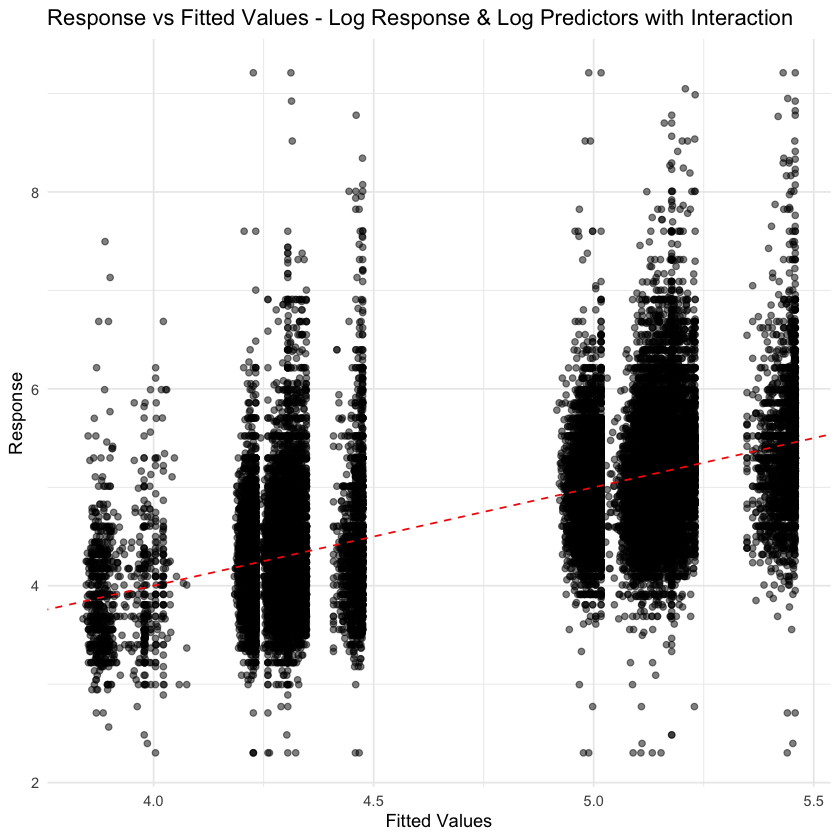

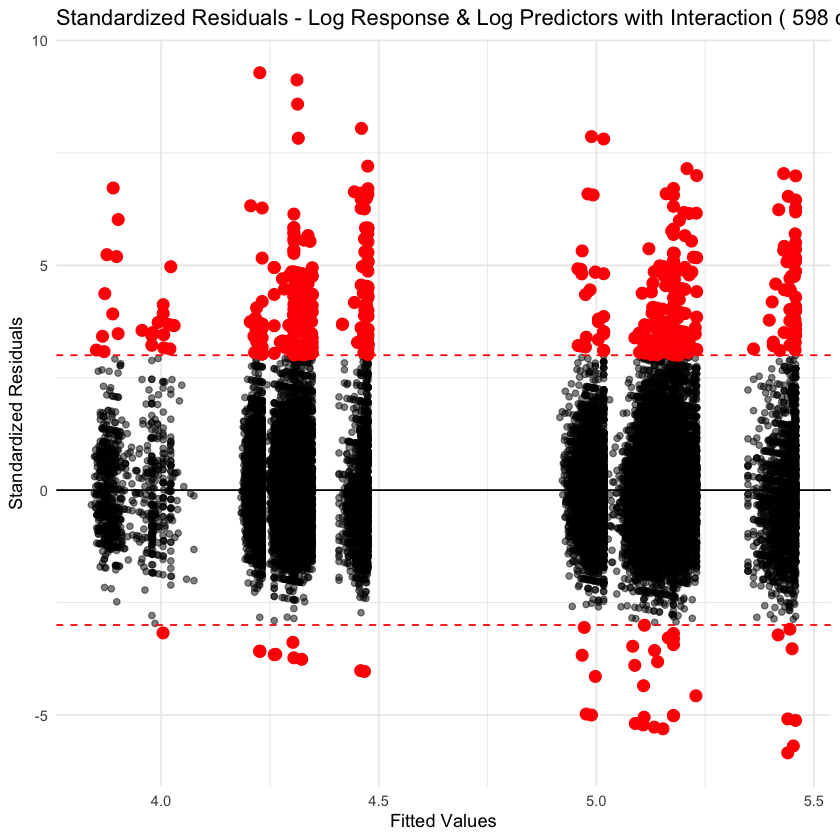

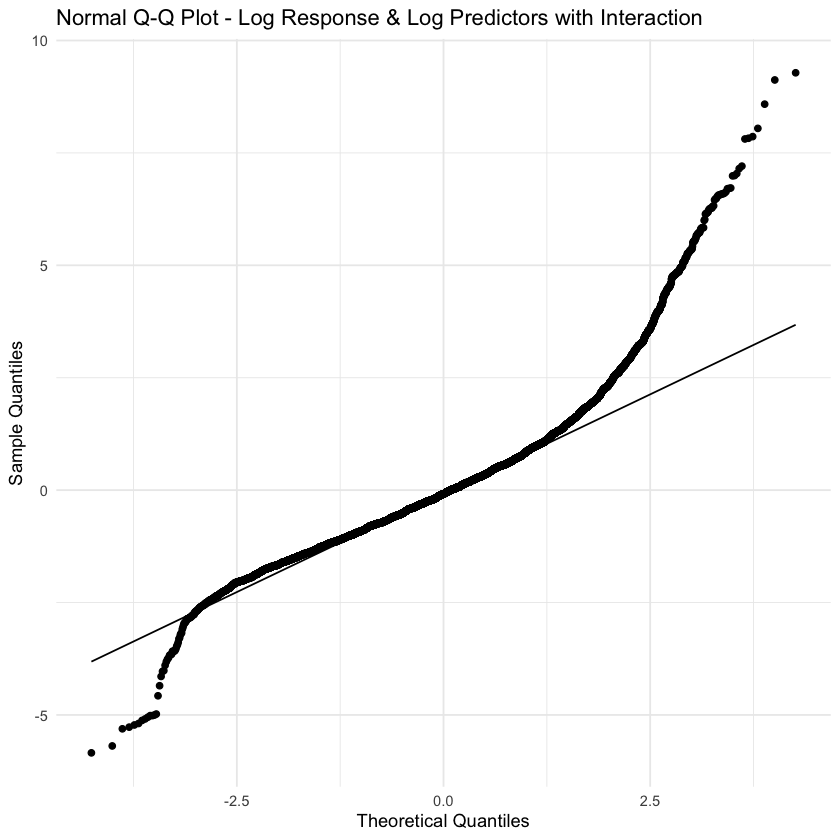

In [40]:
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y, "Log Response")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_interaction, "Log Response with Interaction")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_log_x, "Log Response & Log Predictors")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_log_x_interaction, "Log Response & Log Predictors with Interaction")))


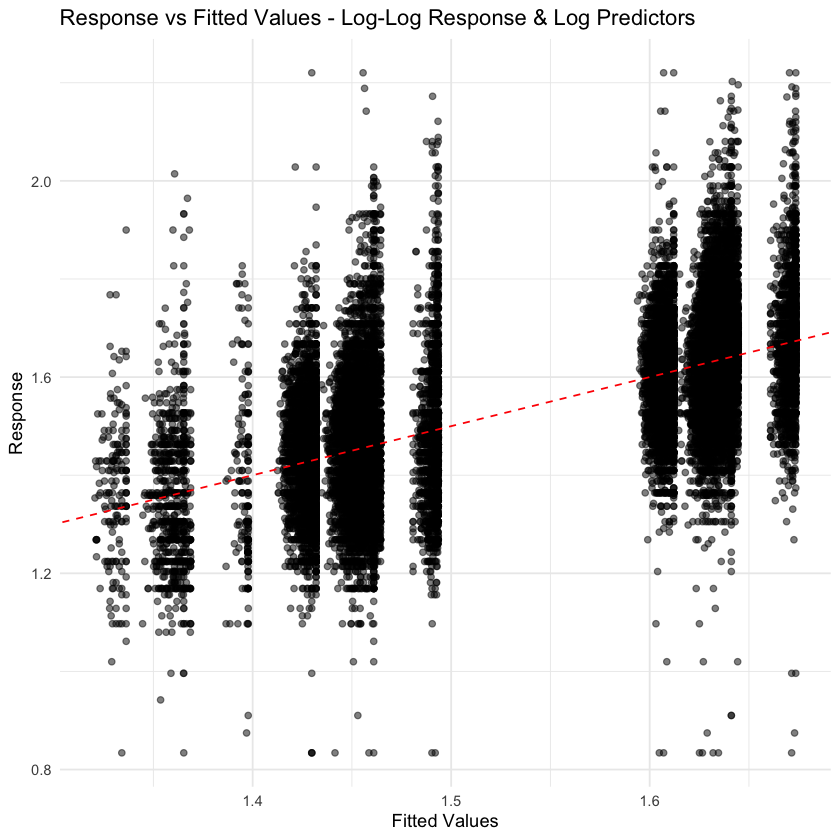

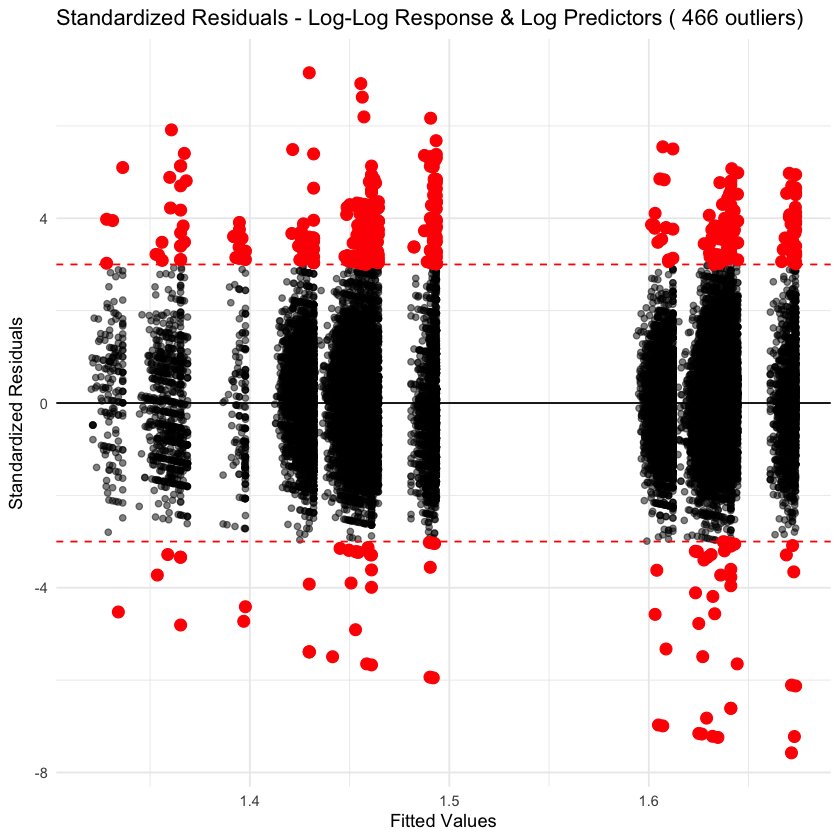

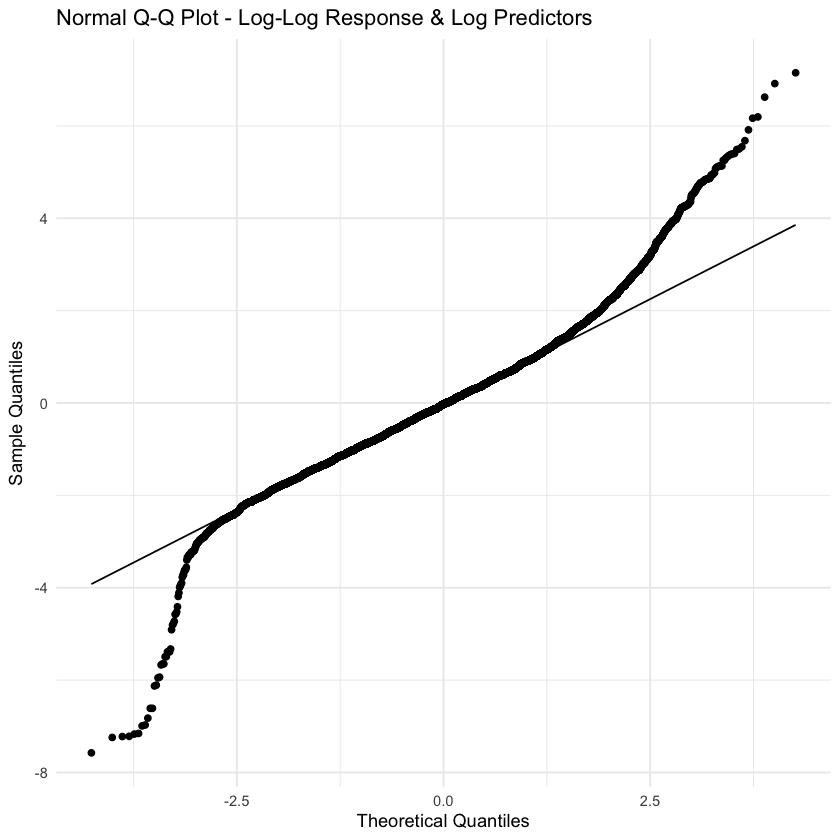

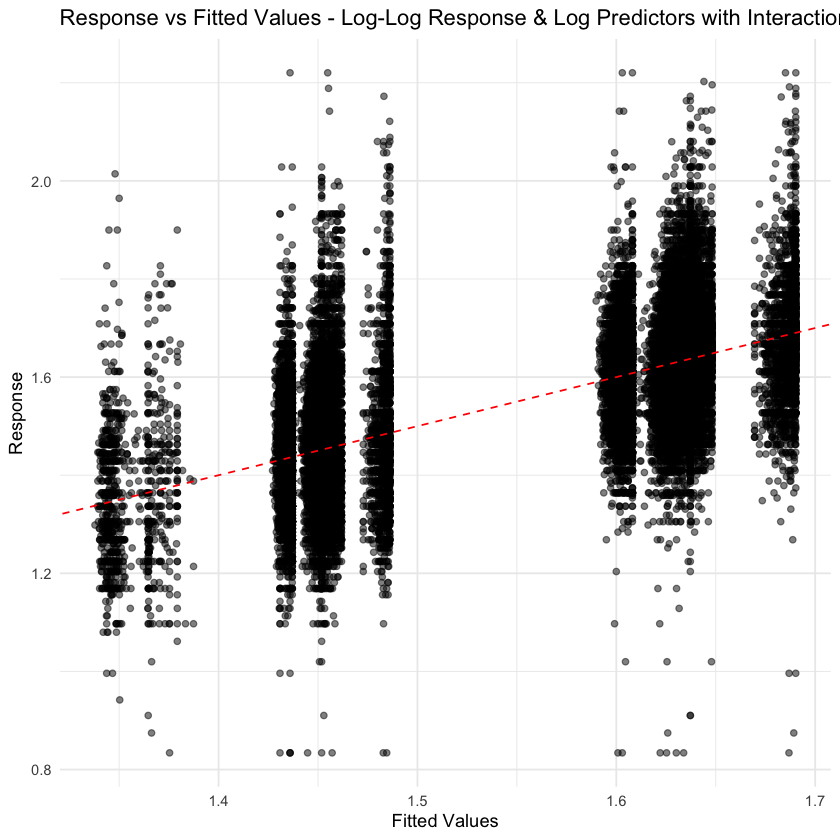

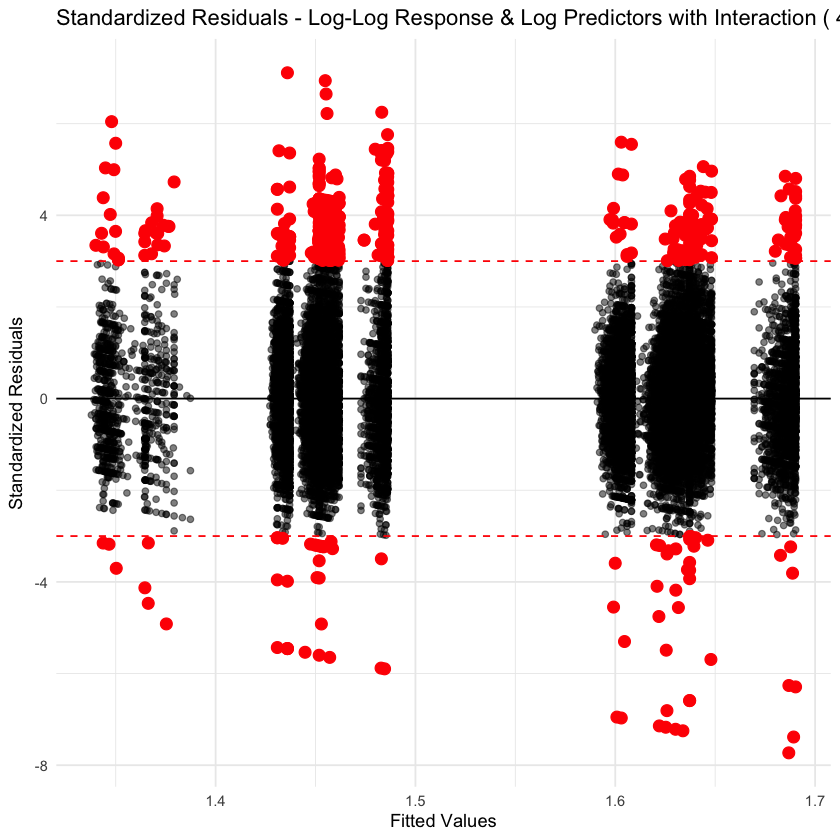

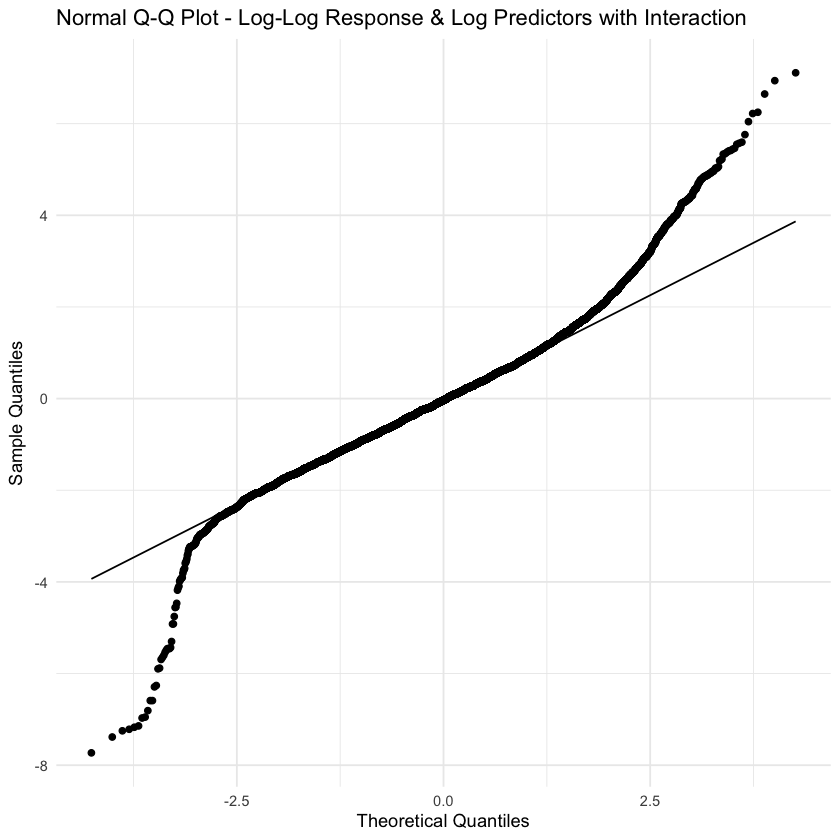

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


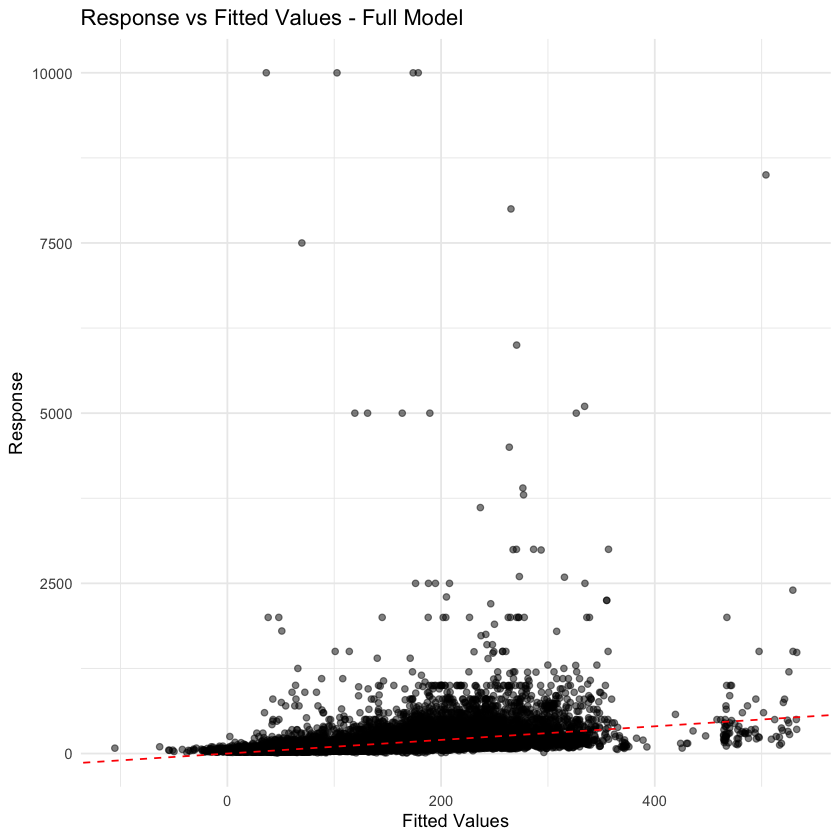

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_qq()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_qq_line()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_qq_line()`).”


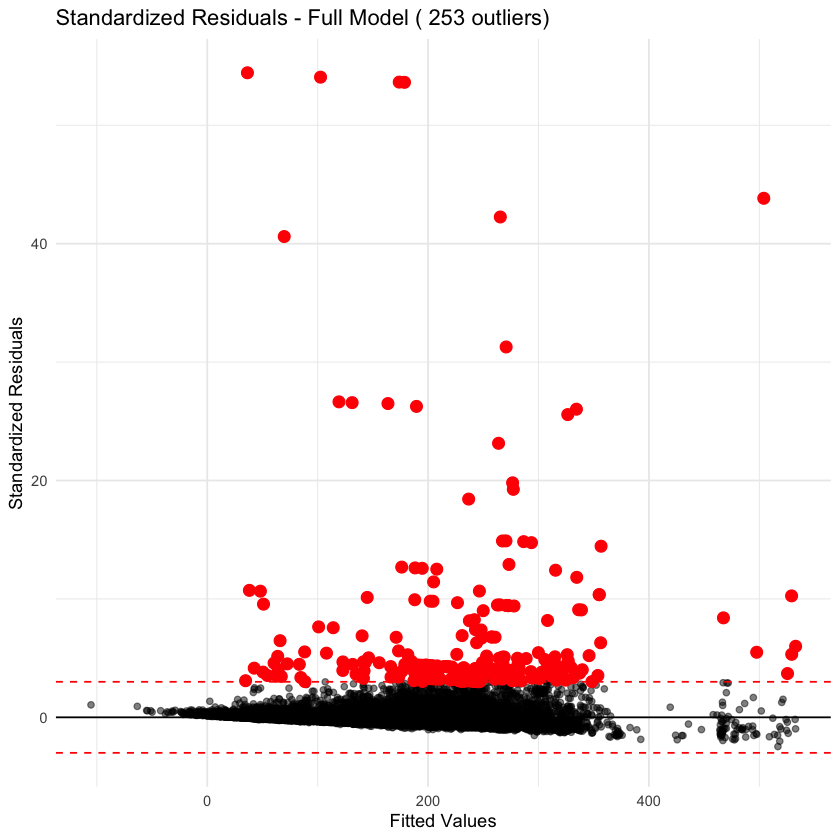

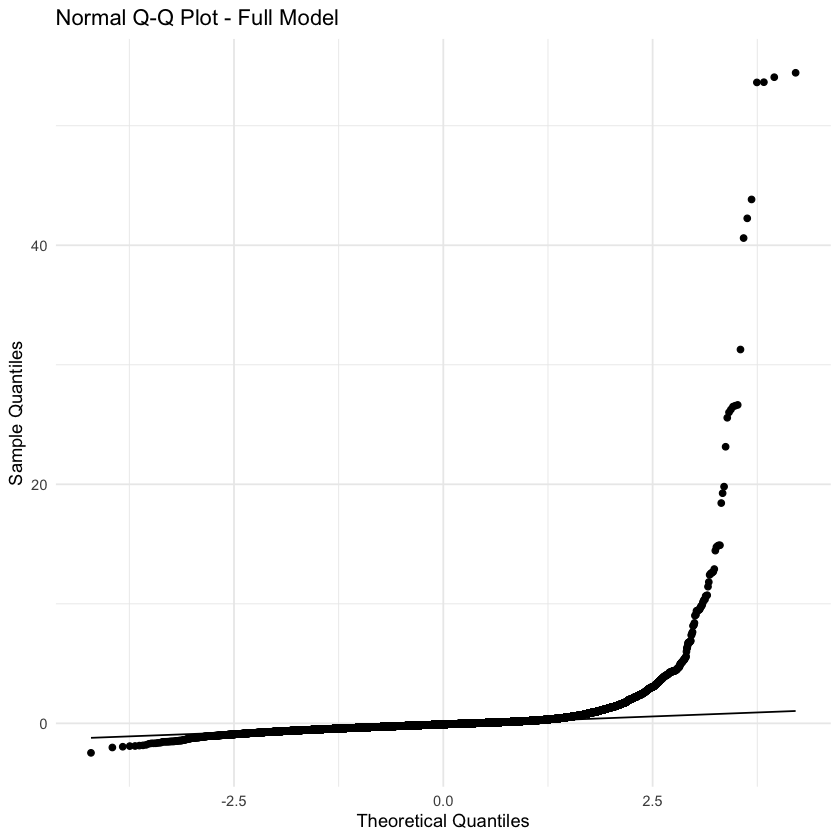

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


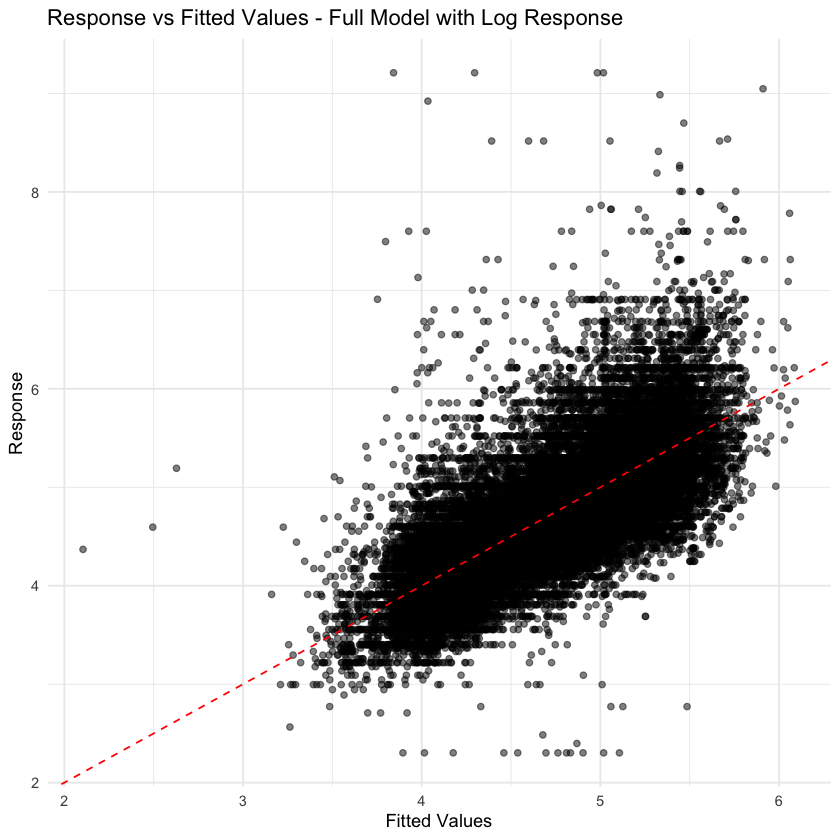

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_qq()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_qq_line()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_qq_line()`).”


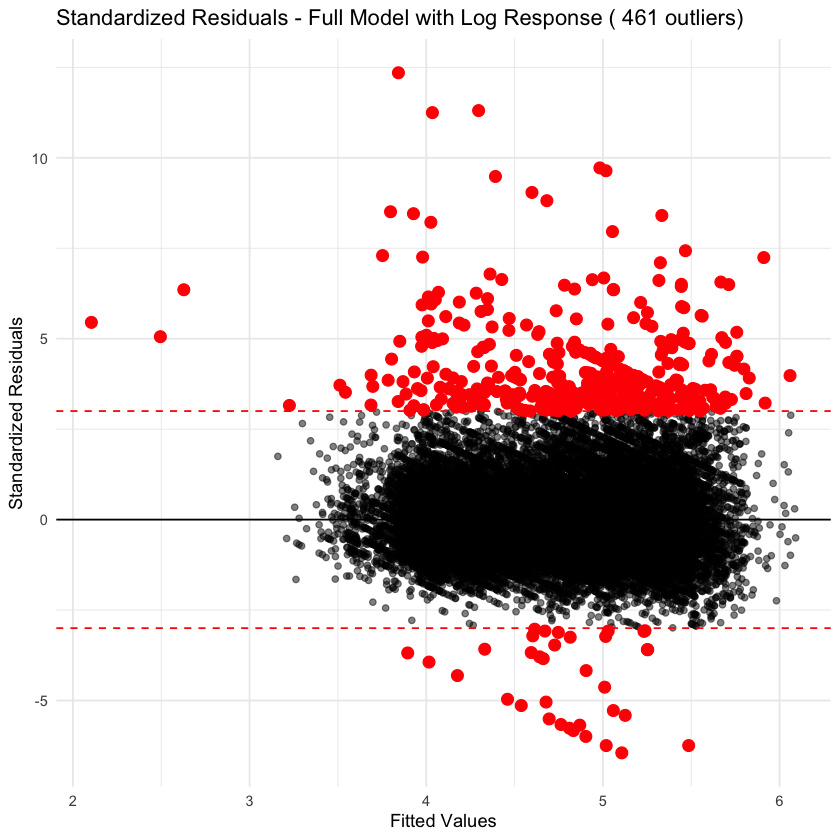

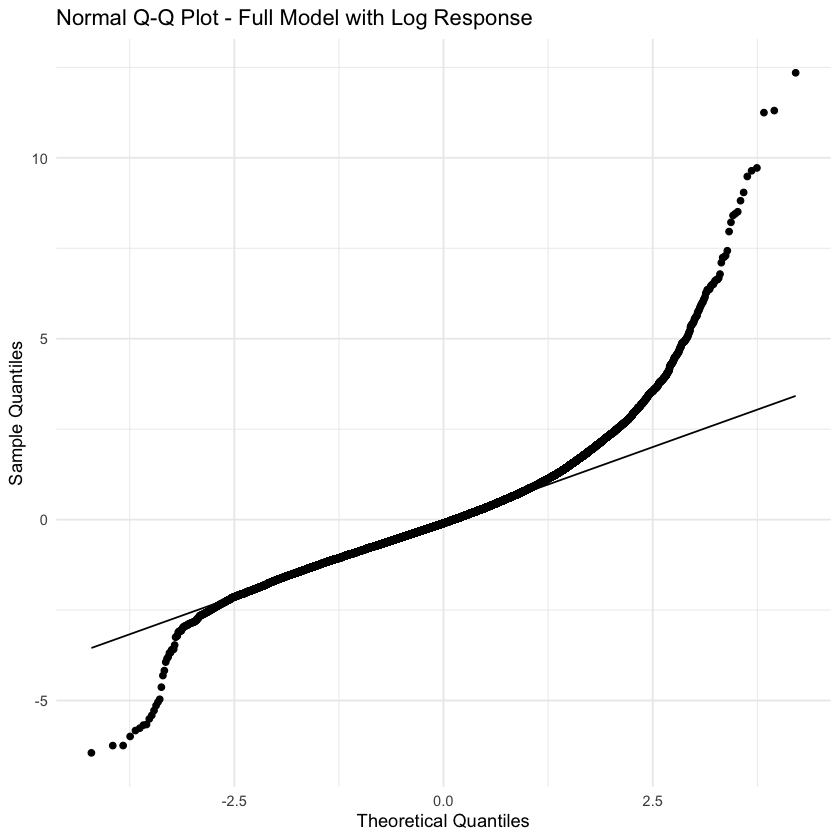

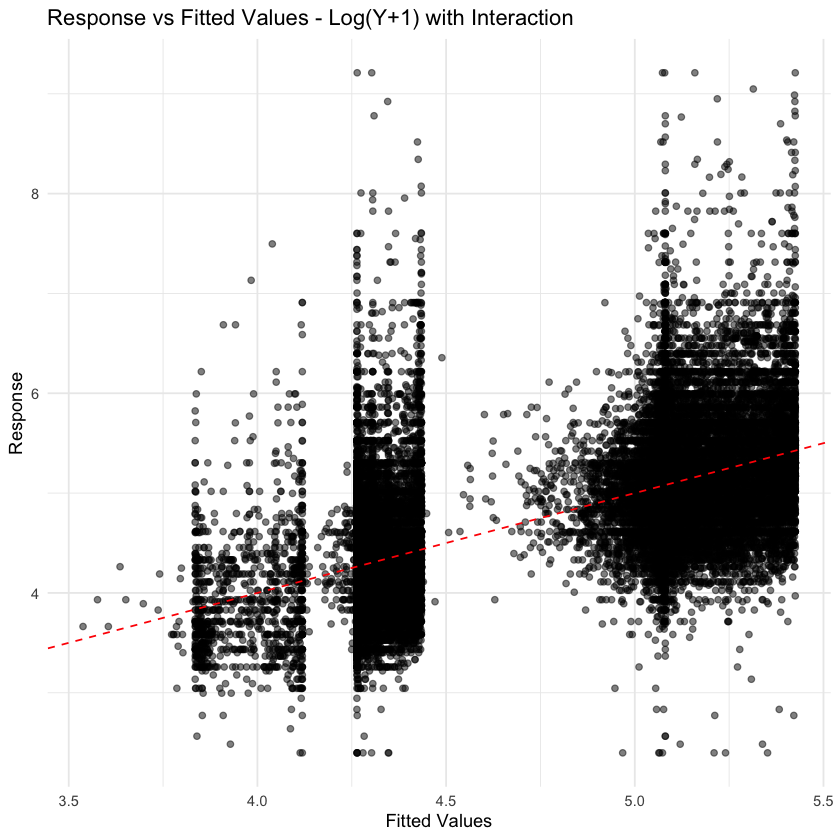

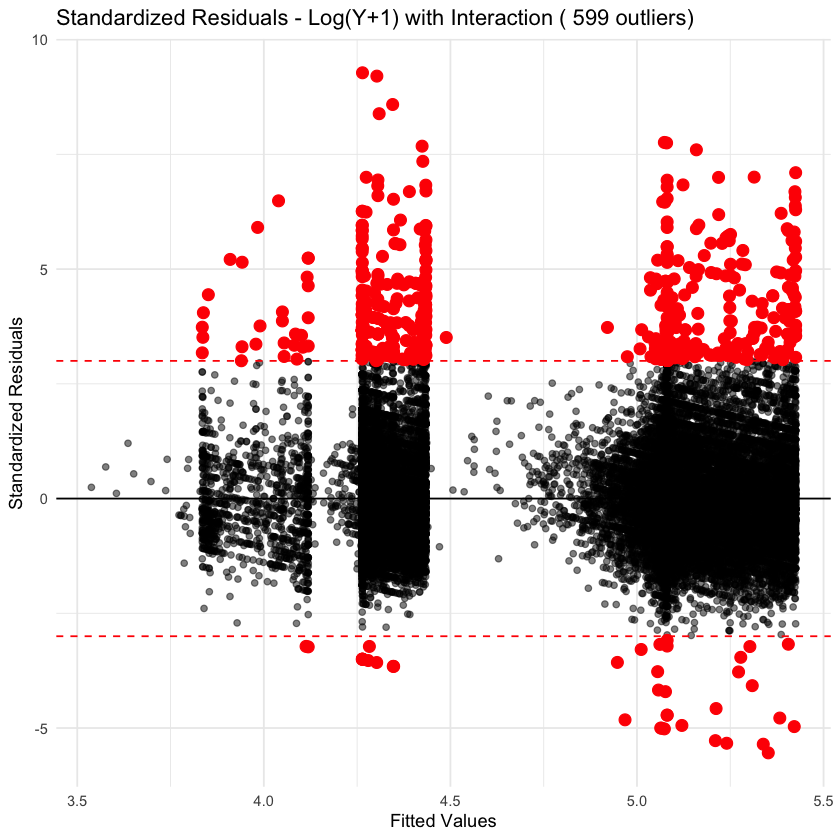

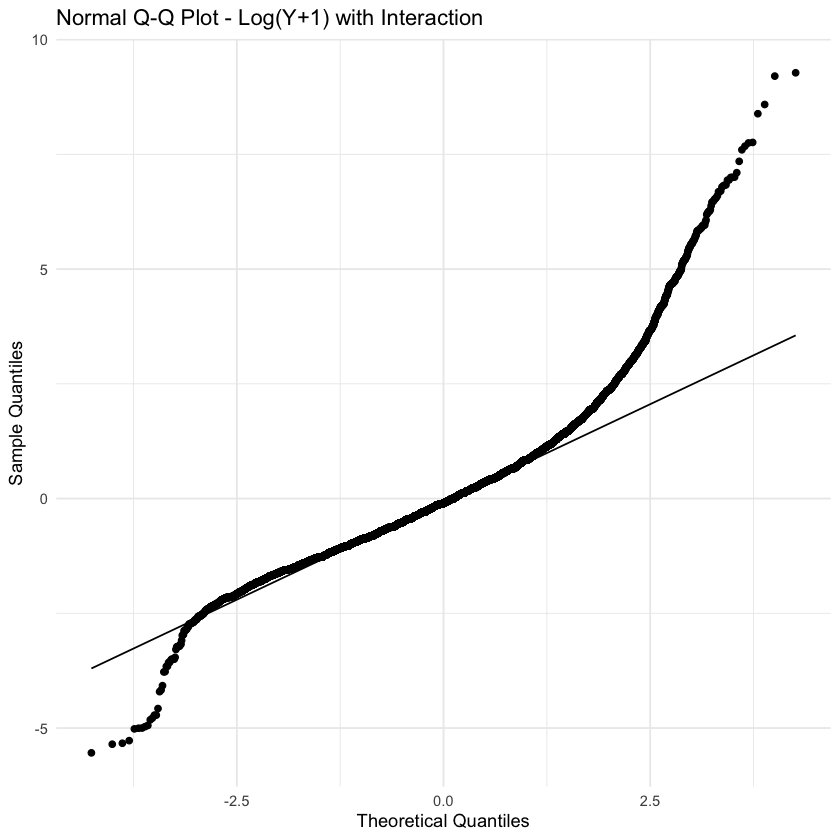

In [41]:
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_log_y_log_x, "Log-Log Response & Log Predictors")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_log_y_log_x_interaction, "Log-Log Response & Log Predictors with Interaction")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_full, "Full Model")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_full_log_y, "Full Model with Log Response")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_plus_one, "Log(Y+1) with Interaction")))


# Additional Model Transformations


In [42]:
# Exponential transformation of predictors
lm_exp_x <- lm(airbnb$price ~ exp(airbnb$number_of_reviews / 100) + exp(airbnb$availability_365 / 100) + airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_exp_x",
        r_squared = summary(lm_exp_x)$r.squared,
        adjusted_r_squared = summary(lm_exp_x)$adj.r.squared
    )
)

lm_exp_x_interaction <- lm(airbnb$price ~ exp(airbnb$number_of_reviews / 100) * exp(airbnb$availability_365 / 100) * airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_exp_x_interaction",
        r_squared = summary(lm_exp_x_interaction)$r.squared,
        adjusted_r_squared = summary(lm_exp_x_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


In [43]:
# Log plus one transformation for both response and predictors
lm_log_y_plus_one_log_x_plus_one <- lm(log(airbnb$price + 1) ~ log(airbnb$number_of_reviews + 1) + log(airbnb$availability_365 + 1) + airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_plus_one_log_x_plus_one",
        r_squared = summary(lm_log_y_plus_one_log_x_plus_one)$r.squared,
        adjusted_r_squared = summary(lm_log_y_plus_one_log_x_plus_one)$adj.r.squared
    )
)

lm_log_y_plus_one_log_x_plus_one_interaction <- lm(log(airbnb$price + 1) ~ log(airbnb$number_of_reviews + 1) * log(airbnb$availability_365 + 1) * airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_plus_one_log_x_plus_one_interaction",
        r_squared = summary(lm_log_y_plus_one_log_x_plus_one_interaction)$r.squared,
        adjusted_r_squared = summary(lm_log_y_plus_one_log_x_plus_one_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


In [44]:
# Square root transformation
lm_sqrt_y <- lm(sqrt(airbnb$price) ~ airbnb$number_of_reviews + airbnb$availability_365 + airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_sqrt_y",
        r_squared = summary(lm_sqrt_y)$r.squared,
        adjusted_r_squared = summary(lm_sqrt_y)$adj.r.squared
    )
)

lm_sqrt_y_sqrt_x <- lm(sqrt(airbnb$price) ~ sqrt(airbnb$number_of_reviews + 0.0001) + sqrt(airbnb$availability_365 + 0.0001) + airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_sqrt_y_sqrt_x",
        r_squared = summary(lm_sqrt_y_sqrt_x)$r.squared,
        adjusted_r_squared = summary(lm_sqrt_y_sqrt_x)$adj.r.squared
    )
)

lm_sqrt_y_sqrt_x_interaction <- lm(sqrt(airbnb$price) ~ sqrt(airbnb$number_of_reviews + 0.0001) * sqrt(airbnb$availability_365 + 0.0001) * airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_sqrt_y_sqrt_x_interaction",
        r_squared = summary(lm_sqrt_y_sqrt_x_interaction)$r.squared,
        adjusted_r_squared = summary(lm_sqrt_y_sqrt_x_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


In [45]:
# Mixed transformations
lm_log_y_sqrt_x <- lm(log(airbnb$price) ~ sqrt(airbnb$number_of_reviews + 0.0001) + sqrt(airbnb$availability_365 + 0.0001) + airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_sqrt_x",
        r_squared = summary(lm_log_y_sqrt_x)$r.squared,
        adjusted_r_squared = summary(lm_log_y_sqrt_x)$adj.r.squared
    )
)

lm_log_y_sqrt_x_interaction <- lm(log(airbnb$price) ~ sqrt(airbnb$number_of_reviews + 0.0001) * sqrt(airbnb$availability_365 + 0.0001) * airbnb$room_type)
model_performance <- rbind(
    model_performance,
    data.frame(
        model_name = "lm_log_y_sqrt_x_interaction",
        r_squared = summary(lm_log_y_sqrt_x_interaction)$r.squared,
        adjusted_r_squared = summary(lm_log_y_sqrt_x_interaction)$adj.r.squared
    )
)
model_performance


model_name,r_squared,adjusted_r_squared
<chr>,<dbl>,<dbl>
lm_type,0.065613666,0.065575444
lm_num_reviews,0.002299608,0.002279202
lm_availability,0.006695957,0.006675641
lm_all,0.076499902,0.076424344
lm_interaction,0.081243624,0.081036879
lm_log_y,0.400584779,0.400535726
lm_log_y_interaction,0.406888599,0.406755103
lm_log_y_log_x,0.405524406,0.405475757
lm_log_y_log_x_interaction,0.408697594,0.408564505


# Evaluating Additional Models


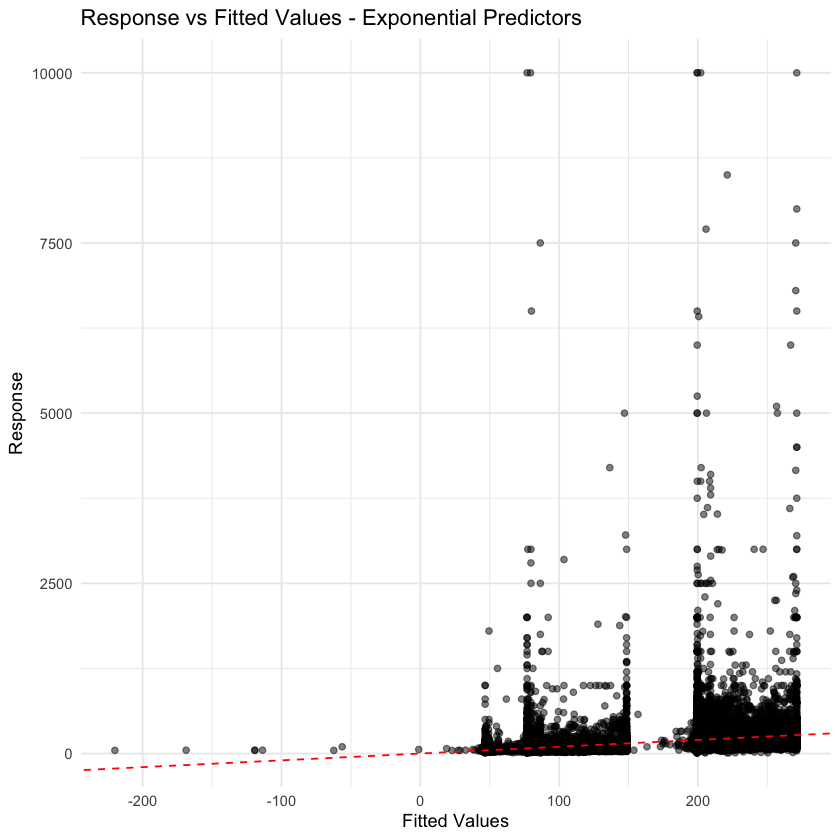

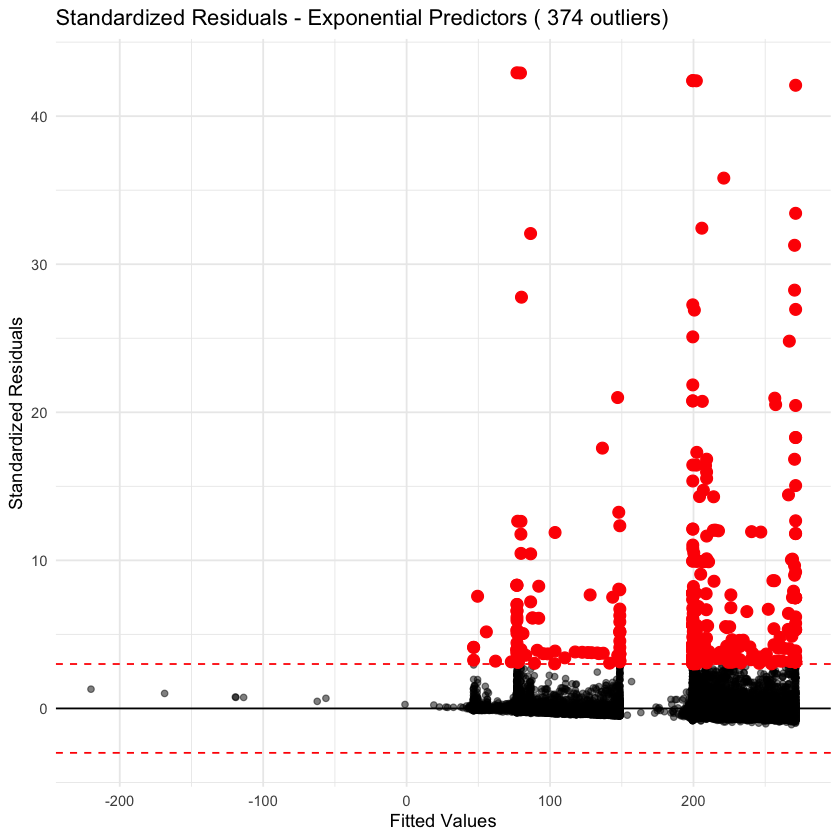

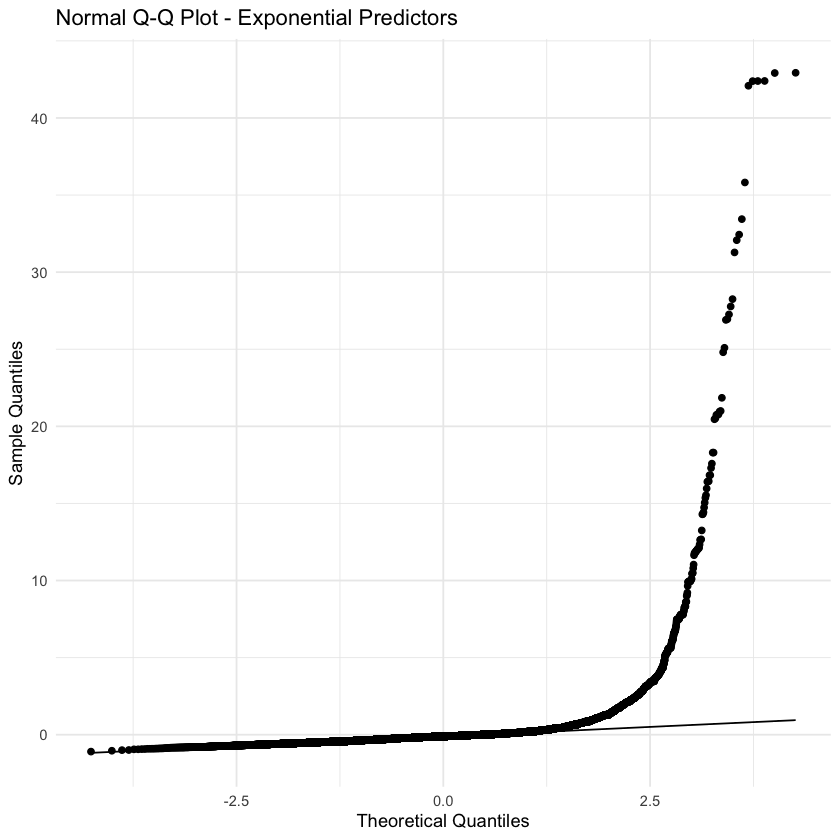

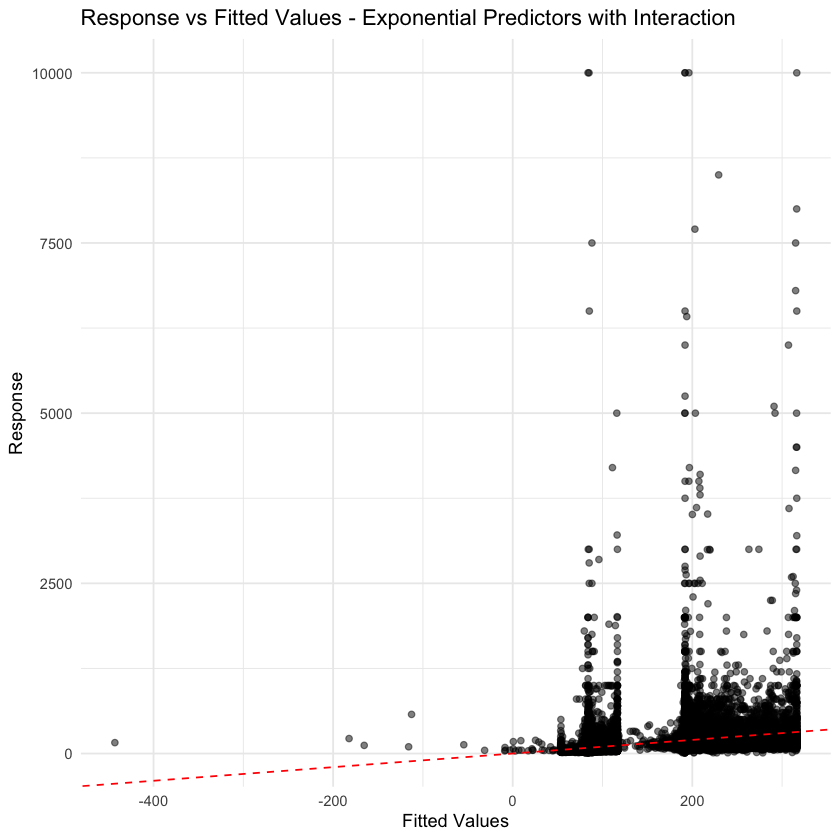

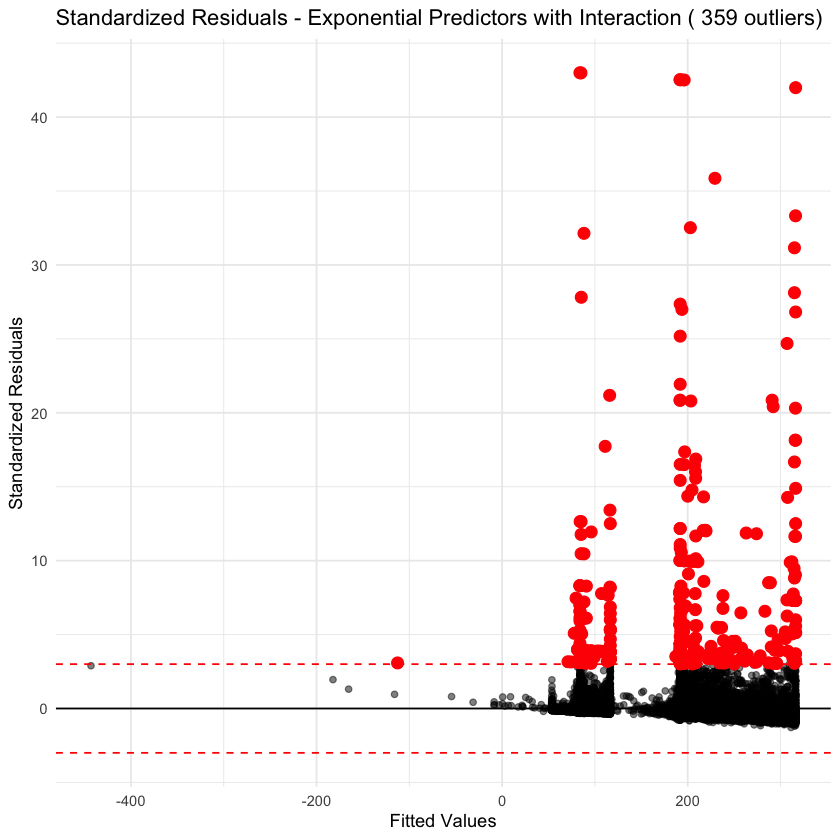

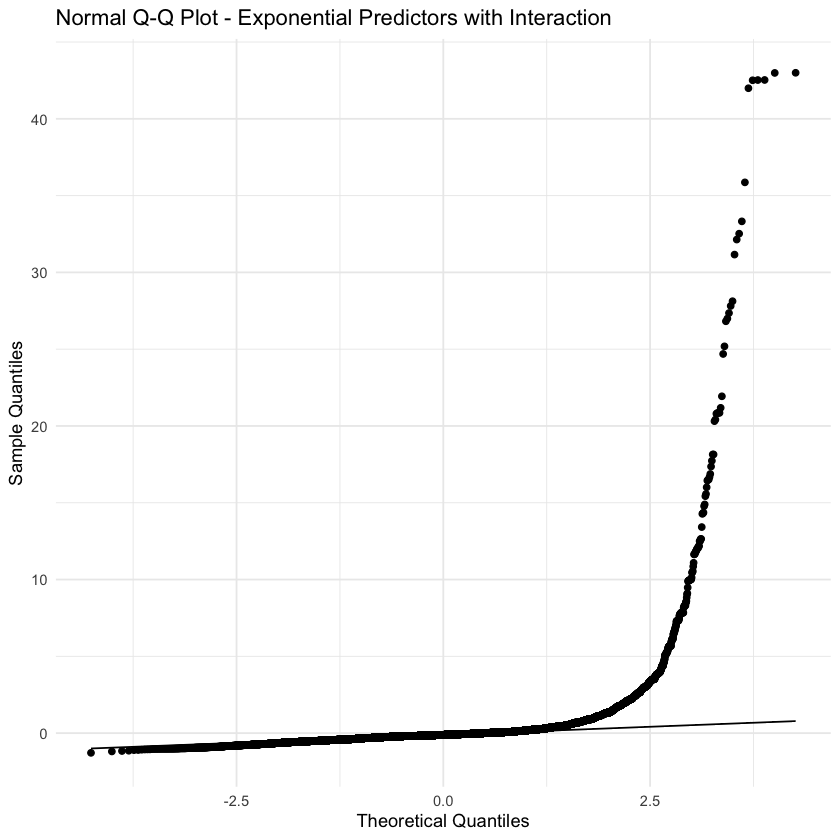

In [46]:
# Evaluate exponential and sqrt transformations
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_exp_x, "Exponential Predictors")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_exp_x_interaction, "Exponential Predictors with Interaction")))


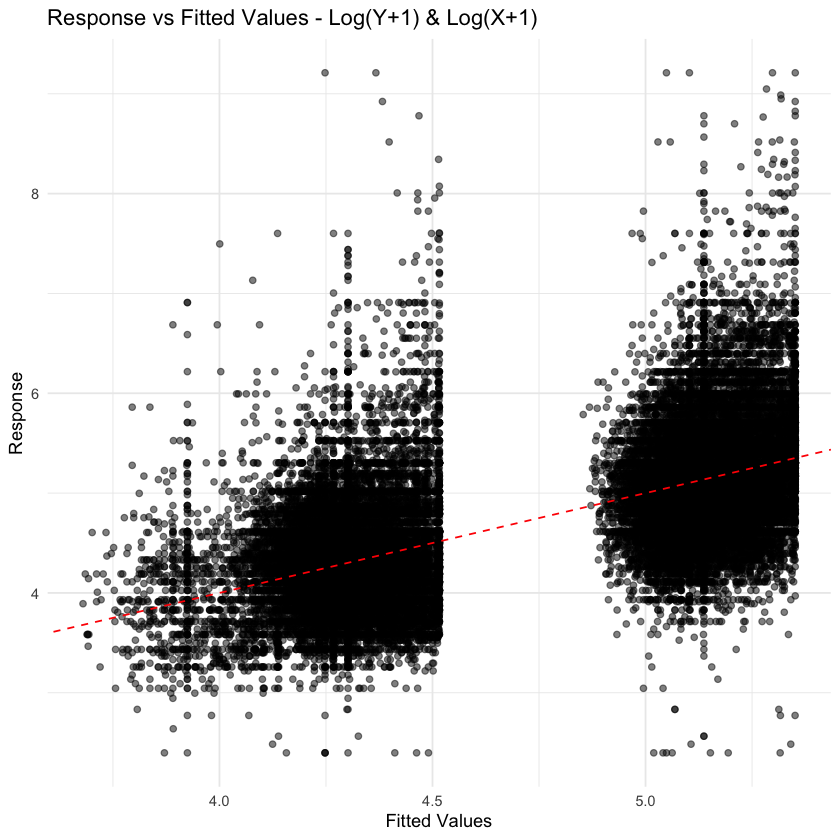

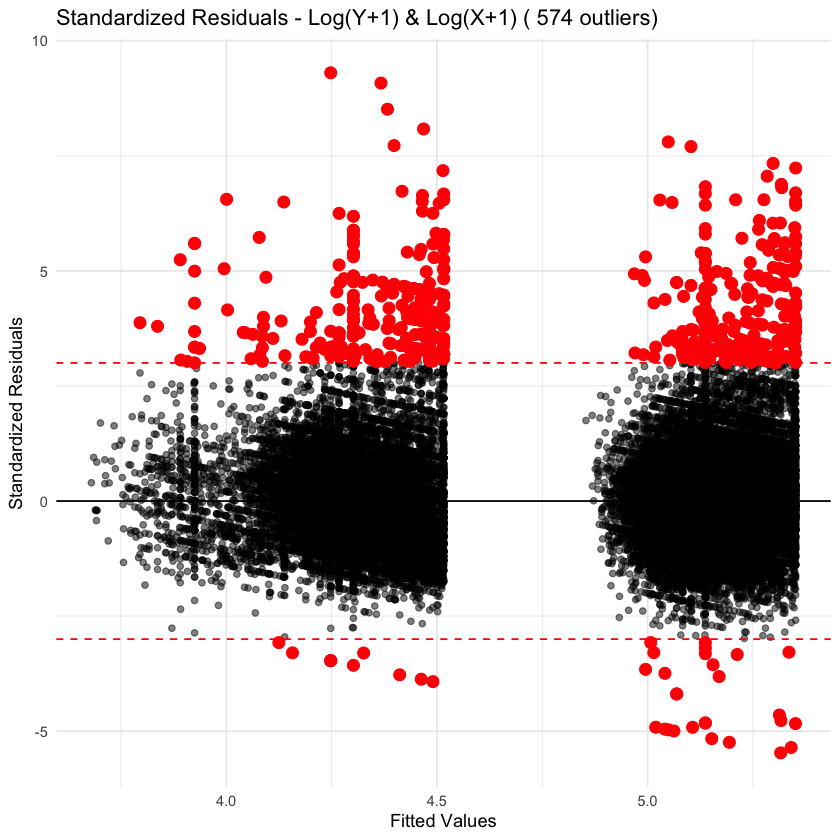

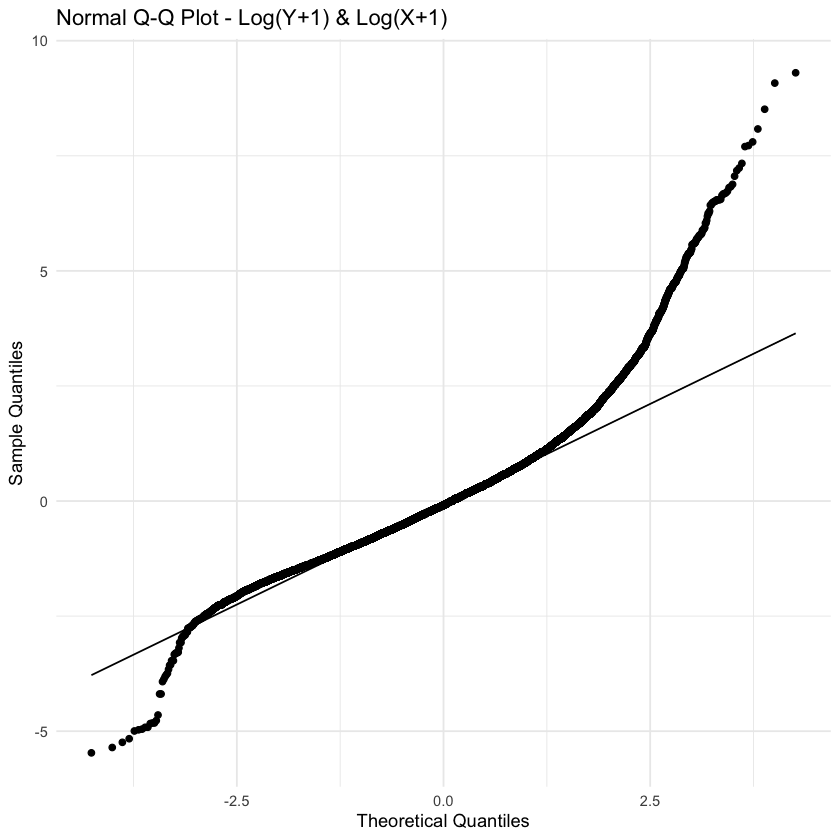

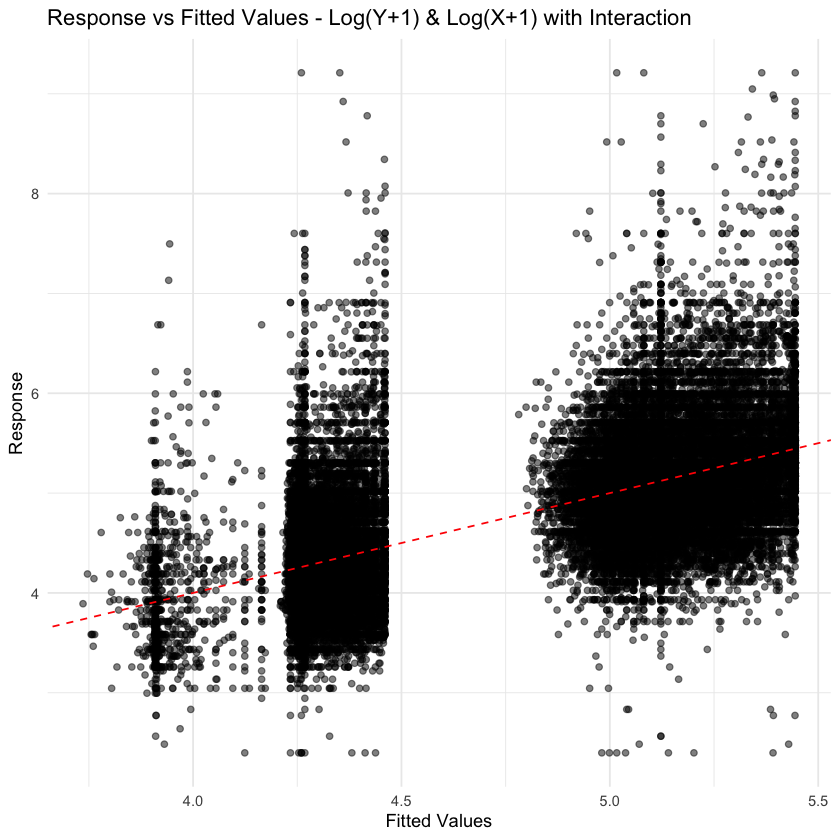

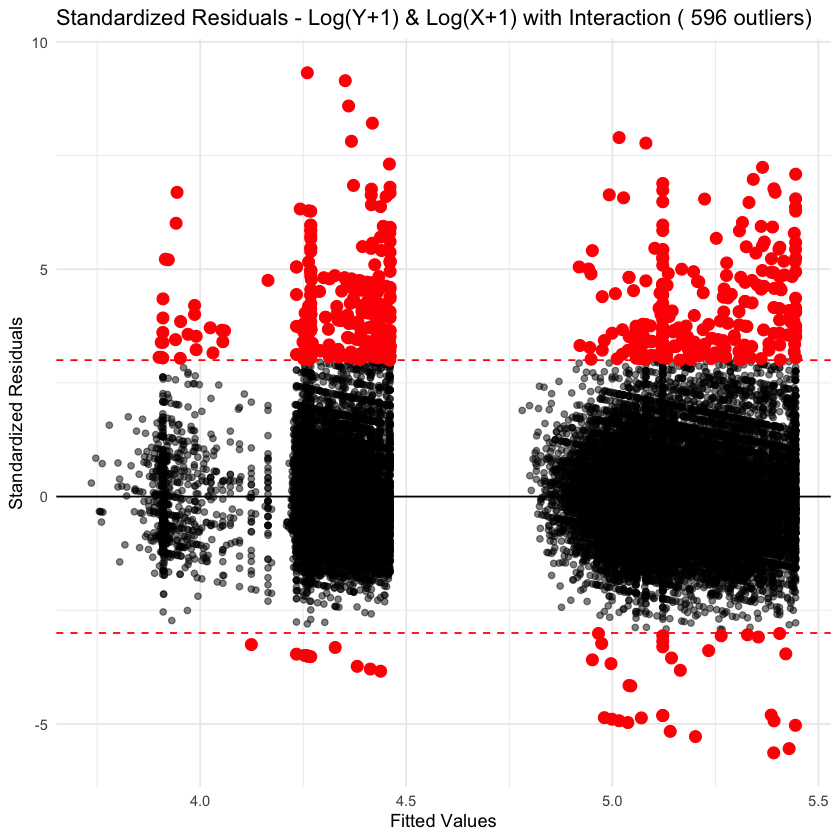

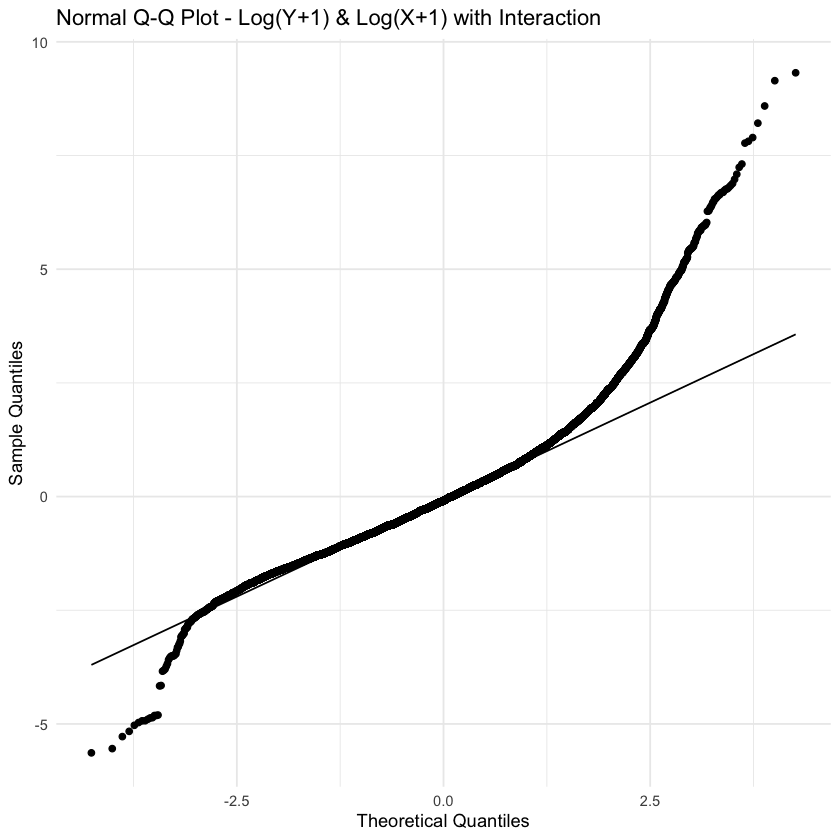

In [47]:
# Evaluate log plus one transformations
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_plus_one_log_x_plus_one, "Log(Y+1) & Log(X+1)")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_plus_one_log_x_plus_one_interaction, "Log(Y+1) & Log(X+1) with Interaction")))


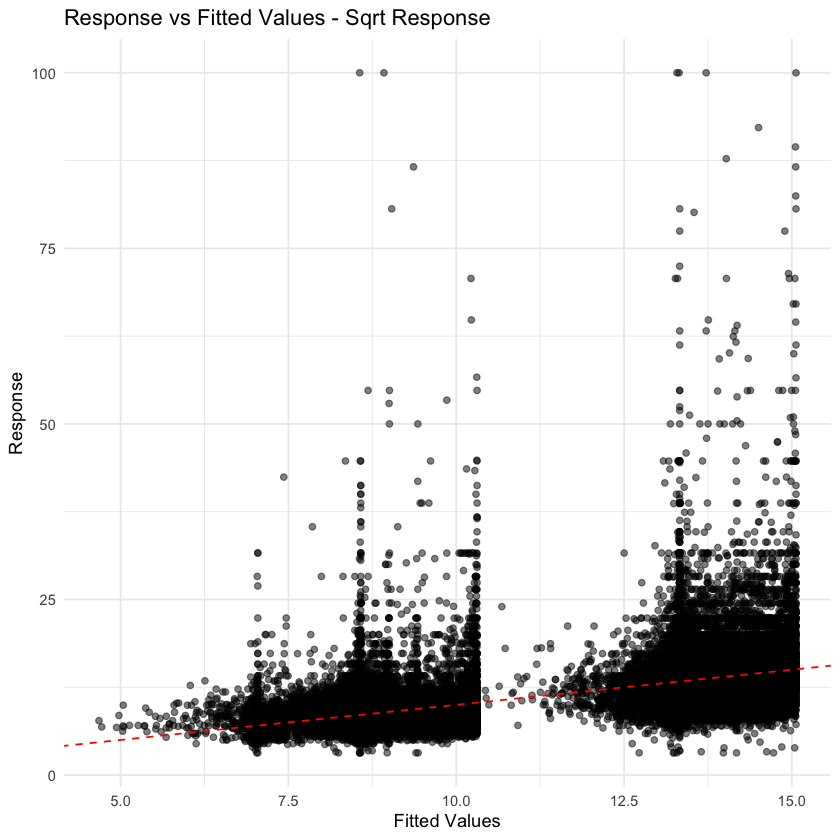

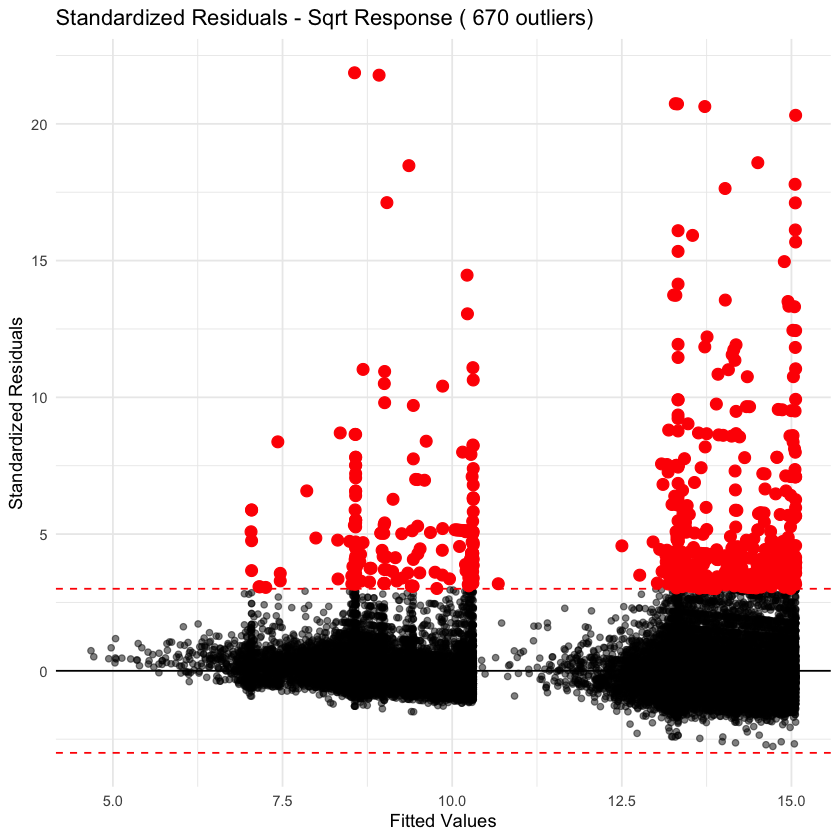

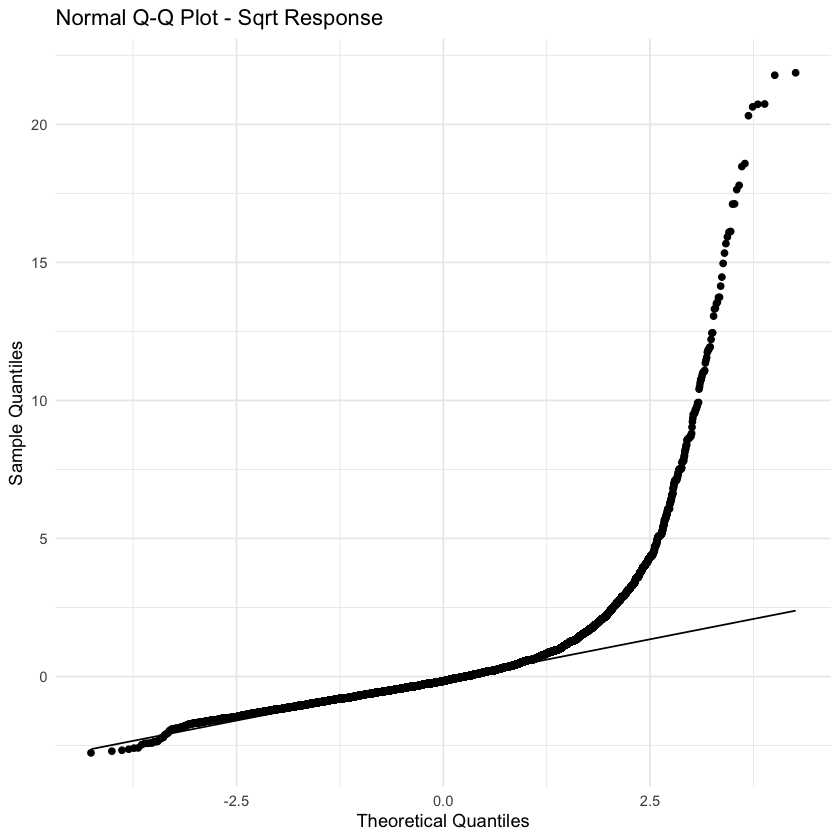

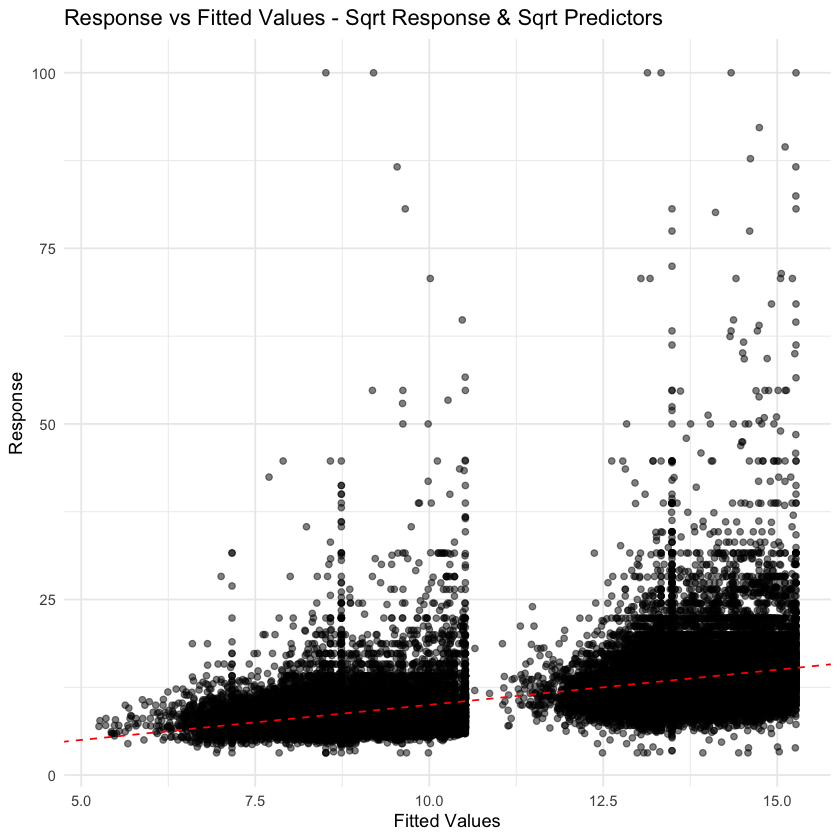

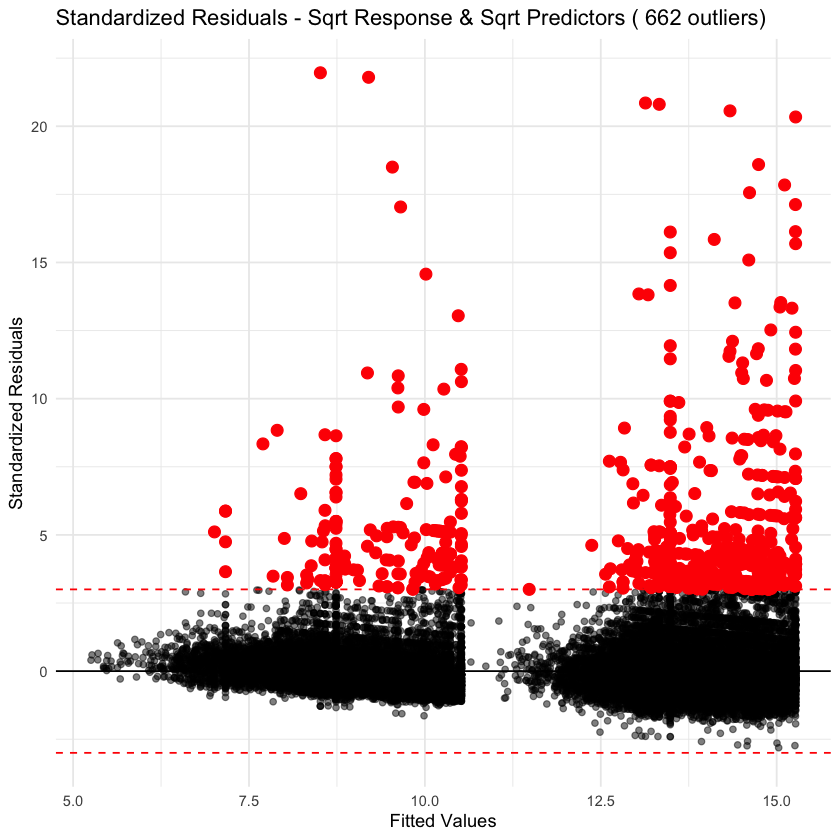

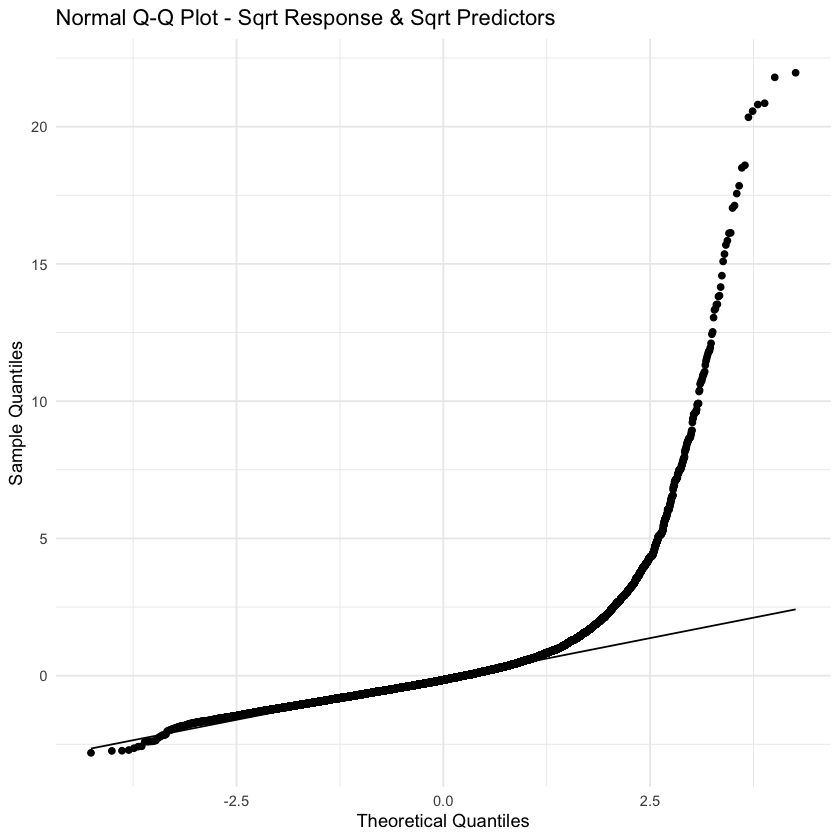

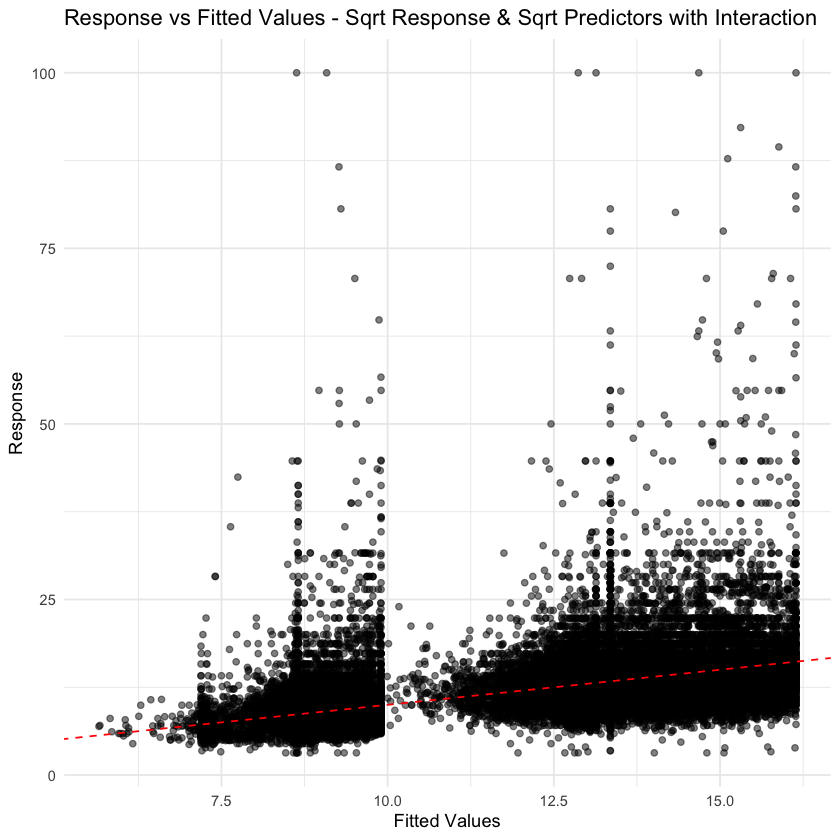

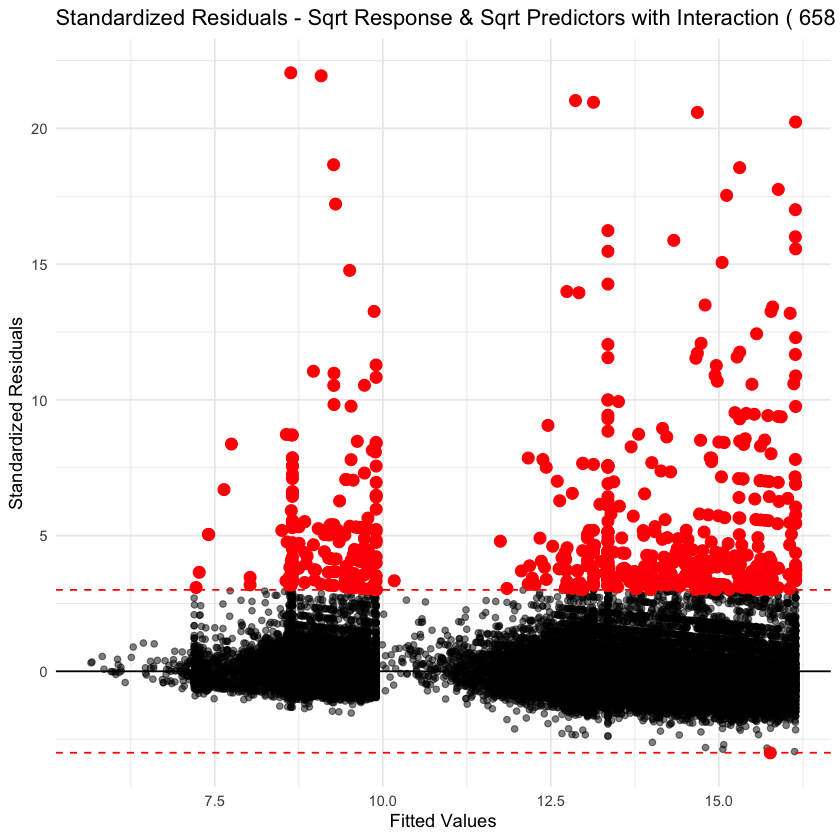

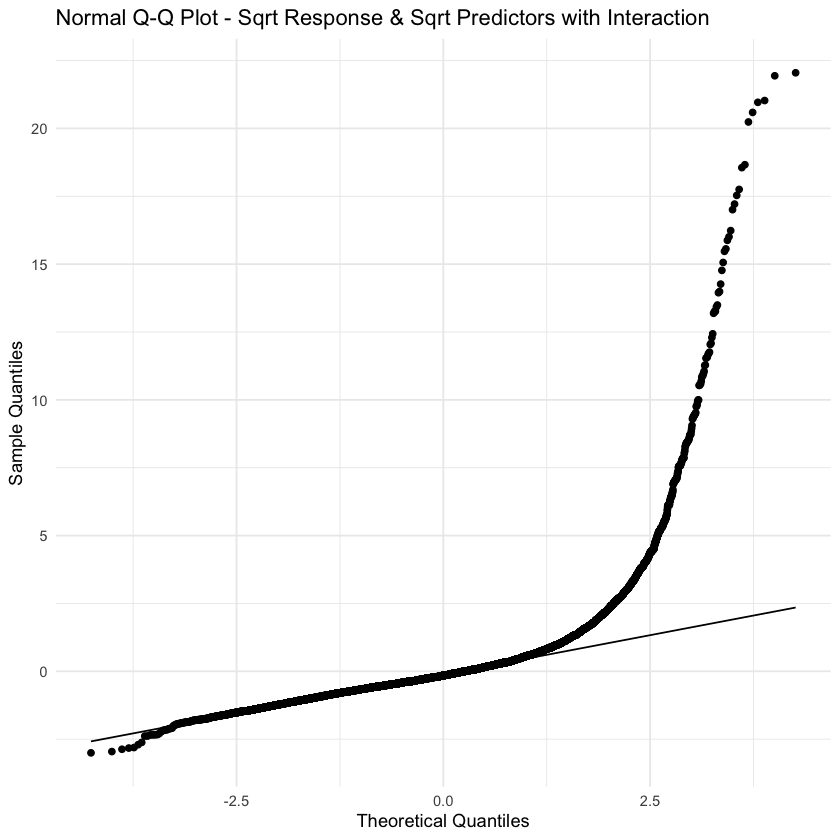

In [48]:
# Evaluate sqrt transformations
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_sqrt_y, "Sqrt Response")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_sqrt_y_sqrt_x, "Sqrt Response & Sqrt Predictors")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_sqrt_y_sqrt_x_interaction, "Sqrt Response & Sqrt Predictors with Interaction")))


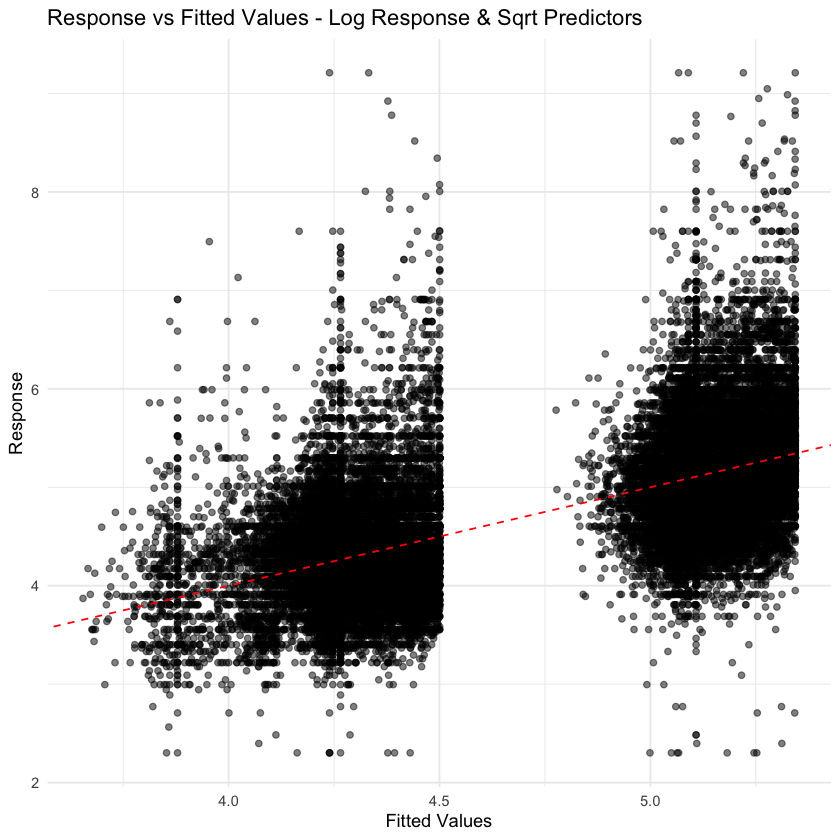

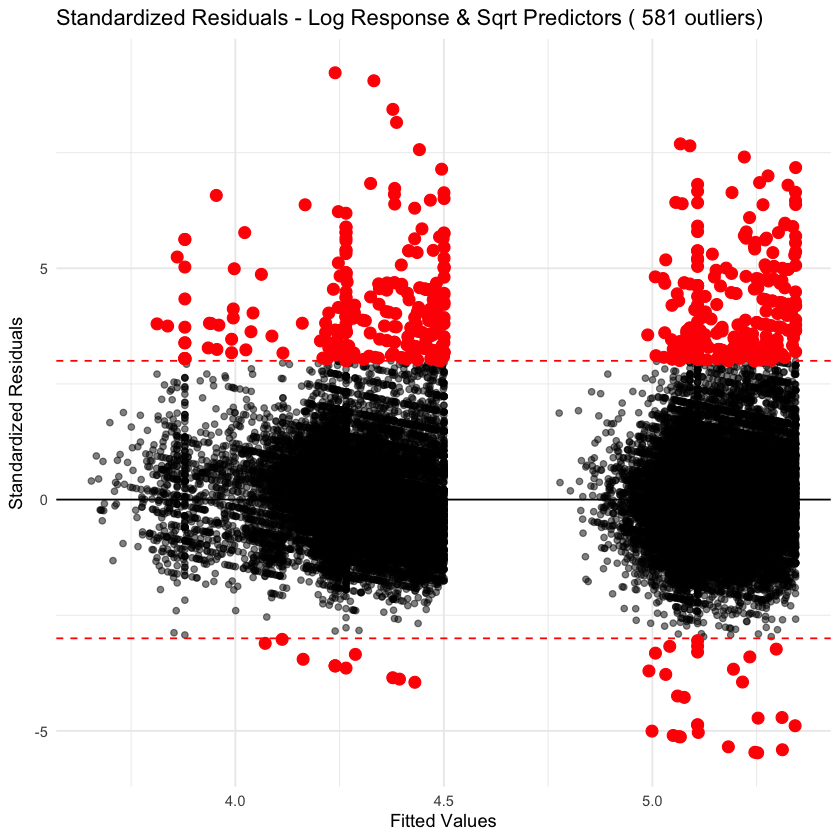

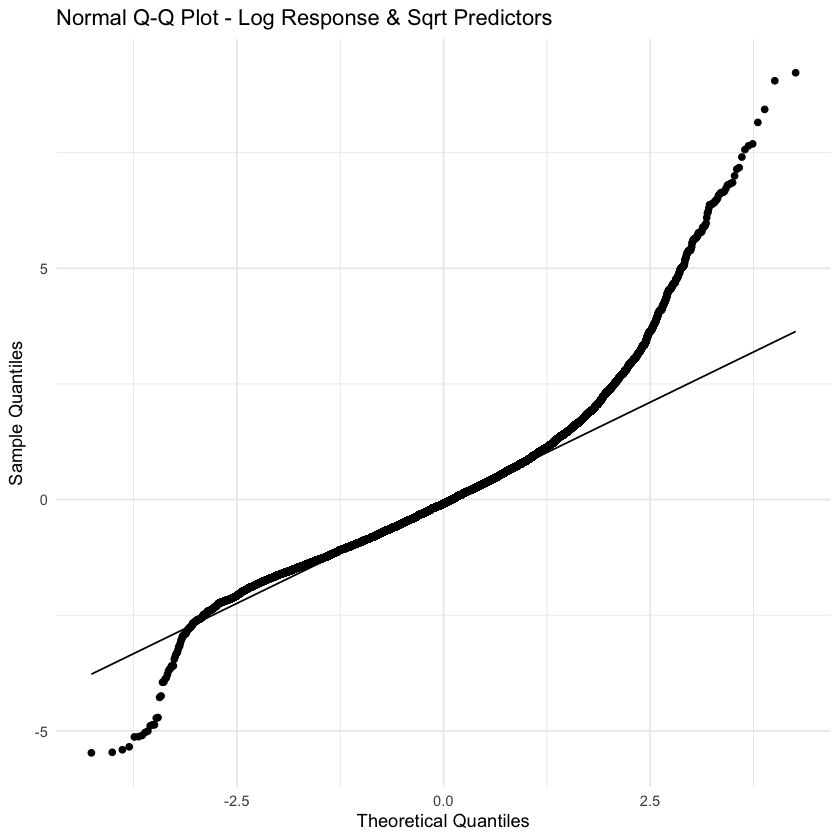

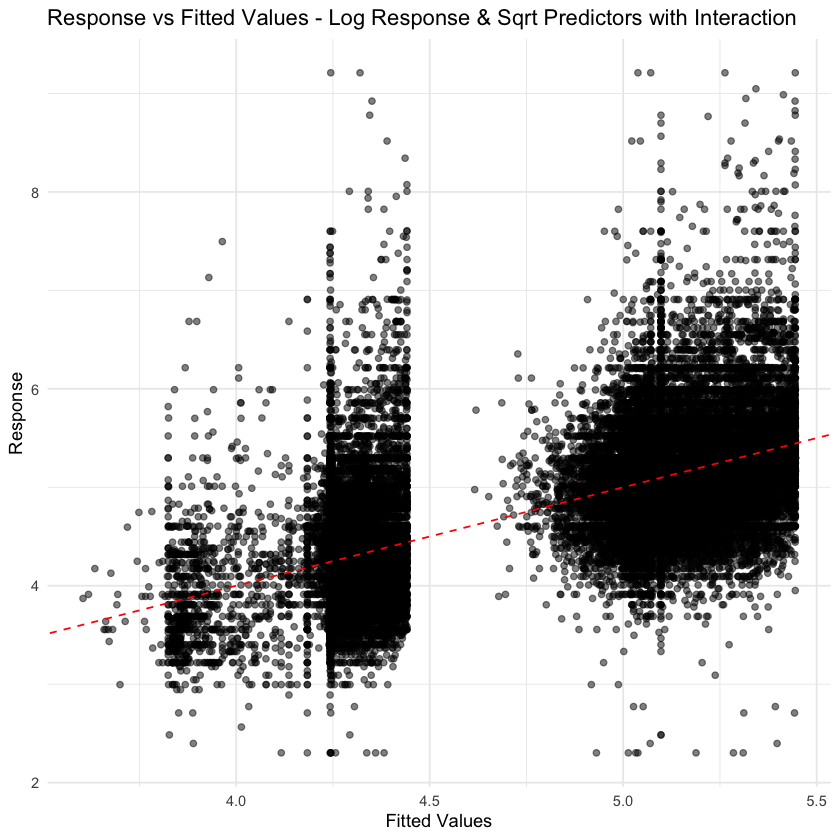

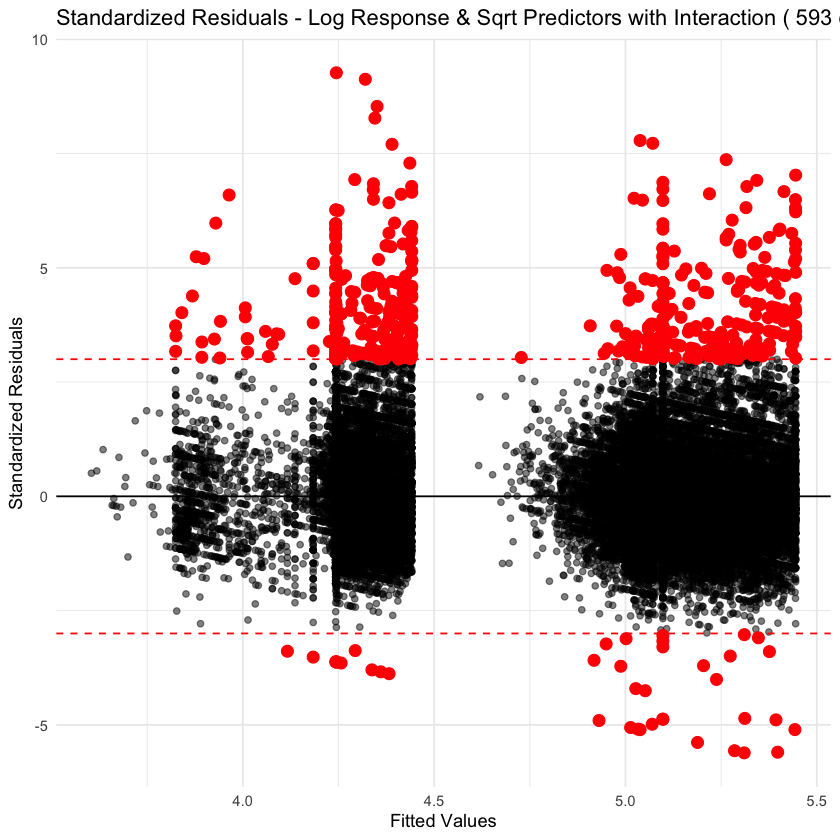

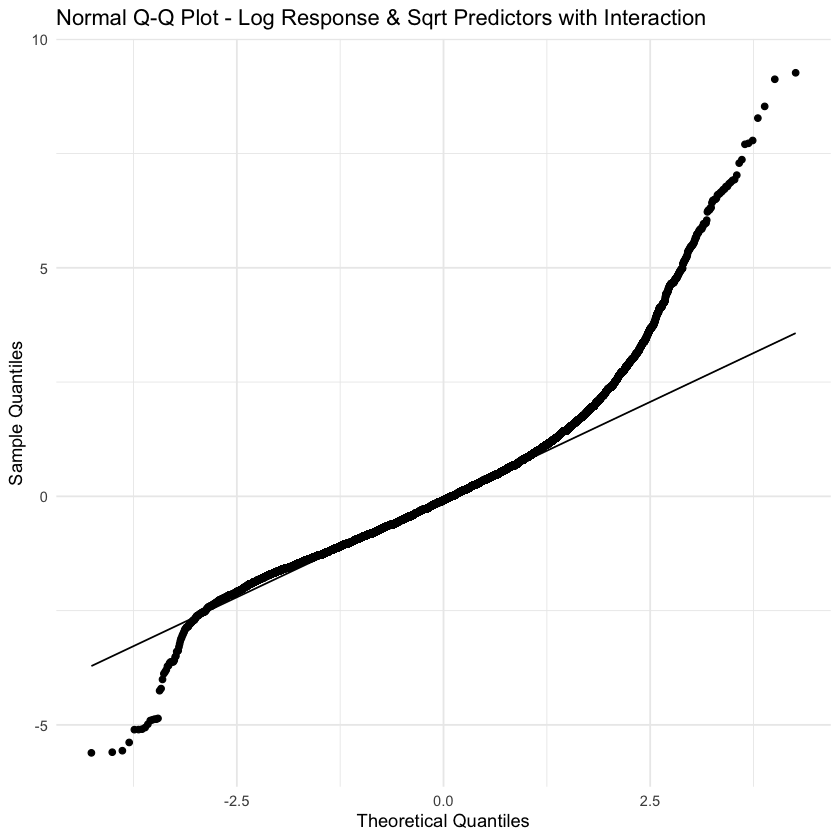

In [49]:
# Evaluate mixed transformations
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_sqrt_x, "Log Response & Sqrt Predictors")))
eval_results <- rbind(eval_results, as.data.frame(evaluate_model(lm_log_y_sqrt_x_interaction, "Log Response & Sqrt Predictors with Interaction")))


# Updated Model Comparison


In [50]:
# Combine updated model performance metrics with evaluation results
combined_results <- merge(model_performance, eval_results,
    by.x = "model_name", by.y = "model_name", all = TRUE
)

# Sort by adjusted R-squared in descending order
combined_results <- combined_results[order(-combined_results$adjusted_r_squared), ]

# Display the top 10 models based on adjusted R-squared
head(combined_results, 10)


,model_name,r_squared,adjusted_r_squared,outliers,mean_std_res,sd_std_res
,<chr>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
13,lm_full_log_y,0.5724681,0.5699653,NA,NA,NA
16,lm_log_log_y_log_x_interaction,0.4280566,0.4279279,NA,NA,NA
15,lm_log_log_y_log_x,0.4255315,0.4254845,NA,NA,NA
25,lm_log_y_sqrt_x_interaction,0.4109613,0.4108287,NA,NA,NA
23,lm_log_y_plus_one_log_x_plus_one_interaction,0.4104492,0.4103165,NA,NA,NA
20,lm_log_y_log_x_interaction,0.4086976,0.4085645,NA,NA,NA
18,lm_log_y_interaction,0.4068886,0.4067551,NA,NA,NA
21,lm_log_y_plus_one,0.4061881,0.4060545,NA,NA,NA
19,lm_log_y_log_x,0.4055244,0.4054758,NA,NA,NA
